In [2]:
import pandas as pd
import numpy as np
import json
from pandas.io.json import json_normalize
import matplotlib.pyplot as plt
import seaborn as sns

/Users/abdullahadlouni/anaconda3/lib/python3.7/site-packages/pandas/compat/_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)
/Users/abdullahadlouni/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
#Project Description
""" Data Source: https://www.kaggle.com/datasets/gyejr95/league-of-legendslol-ranked-games-2020-ver1 """

""" Project Details"""

""" The primary goal of this project is to identify primary strategies that lead to victory (Win Conditions). 
Do these conditions result in a win or a loss? 
So players that did X led to a binary outcome.. either  1 for a win or 0 for a loss. 
This might be an opportunity to try a logistic regression (Binary Classification). 
I have a feeling that given there are different skill levels that might actually muddy the actual win conditions. 
I suspect that i may have to try two seperate models, one where rank(is indicative of competitive skill level
(Noob vs Pro), is considered against another model where it is not. 
The variable of rank maybe removed if found insignificantor does not provide necessary explanitory power. 
As we monitor and study the different activities,as well as items purchased, and objectives certain conditions 
may provide more insight and contribute more significantly to victory. 
I am a subject matter expert when it comes to in game knowledge (As i used to play the game.)
It will be surprising to see whether my expectations pertaining 
to significant strategies will hold ground. """


' The primary goal of this project is to identify primary strategies that lead to victory (Win Conditions). \nDo these conditions result in a win or a loss? \nSo players that did X led to a binary outcome.. either  1 for a win or 0 for a loss. \nThis might be an opportunity to try a logistic regression (Binary Classification). \nI have a feeling that given there are different skill levels that might actually muddy the actual win conditions. \nI suspect that i may have to try two seperate models, one where rank(is indicative of competitive skill level\n(Noob vs Pro), is considered against another model where it is not. \nThe variable of rank maybe removed if found insignificantor does not provide necessary explanitory power. \nAs we monitor and study the different activities,as well as items purchased, and objectives certain conditions \nmay provide more insight and contribute more significantly to victory. \nI am a subject matter expert when it comes to in game knowledge (As i used to 

In [5]:
#Data Description
"""Sample output... too many attributes to put into this field
teamId                  108829 non-null int64
win                     108817 non-null object
firstBlood              108829 non-null bool
firstTower              108829 non-null bool
firstInhibitor          108829 non-null bool
firstBaron              108829 non-null bool
firstDragon             108829 non-null bool
firstRiftHerald         108829 non-null bool
towerKills              108829 non-null int64
inhibitorKills          108829 non-null int64
baronKills              108829 non-null int64
dragonKills             108829 non-null int64
vilemawKills            108829 non-null int64
riftHeraldKills         108829 non-null int64
dominionVictoryScore    108829 non-null int64
bans                    108829 non-null object
gameId                  108829 non-null float64
dtypes: bool(6), float64(1), int64(8), object(2)"""

'Sample output... too many attributes to put into this field\nteamId                  108829 non-null int64\nwin                     108817 non-null object\nfirstBlood              108829 non-null bool\nfirstTower              108829 non-null bool\nfirstInhibitor          108829 non-null bool\nfirstBaron              108829 non-null bool\nfirstDragon             108829 non-null bool\nfirstRiftHerald         108829 non-null bool\ntowerKills              108829 non-null int64\ninhibitorKills          108829 non-null int64\nbaronKills              108829 non-null int64\ndragonKills             108829 non-null int64\nvilemawKills            108829 non-null int64\nriftHeraldKills         108829 non-null int64\ndominionVictoryScore    108829 non-null int64\nbans                    108829 non-null object\ngameId                  108829 non-null float64\ndtypes: bool(6), float64(1), int64(8), object(2)'

In [6]:
# Read in Pickled Files
#File size is 1.13 GB, shape -- (108829, 14)
md_df = pd.read_pickle('match_data_version1.pickle')

In [7]:
#Read in second Pickled File
#File size is 2.26 GB, shape -- (145796, 15)
md2_df = pd.read_pickle('match_data_version2.pickle')

In [8]:
#File size is 18.6 MB, shape -- (108829, 17)
mdwinner_df = pd.read_pickle('match_winner_data_version1.pickle')
#File size is 18.4 MB, shape -- (108829, 17)
mdloser_df = pd.read_pickle('match_loser_data_version1.pickle')

In [9]:
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', None) 

In [10]:
#Data Cleaning
"""There are many nested json objects within this dataset, they contain fields such as champions in play, 
the turn in which they were chosen, etc. Many of the champion fields need to be one how encoded to be applied to the 
logistic regression. While game IDs and user IDs need to be mapped"""

'There are many nested json objects within this dataset, they contain fields such as champions in play, \nthe turn in which they were chosen, etc. Many of the champion fields need to be one how encoded to be applied to the \nlogistic regression. While game IDs and user IDs need to be mapped'

In [11]:
md_df.index = md_df.index.astype('int')

In [12]:
"""Handle Winners Dataframe"""
mdwinner_df_parsed = pd.json_normalize(mdwinner_df['bans']).set_index([mdwinner_df.gameId,mdwinner_df.teamId])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to mdwinner dataframe

parsed_winner = pd.json_normalize(mdwinner_df_parsed.iloc[:,0]).set_index([mdwinner_df.gameId,mdwinner_df.teamId])
list_of_dfs = []
for i in range(int(len(mdwinner_df_parsed.columns))):
    parsed_winner = pd.json_normalize(mdwinner_df_parsed.iloc[:,i]).set_index([mdwinner_df.gameId,mdwinner_df.teamId])
    parsed_winner.rename(columns={'championId': 'championID_' + str(i+1), 'pickTurn': 'pickTurn_' + str(i+1)} , inplace = True)
    list_of_dfs.append(parsed_winner)
    

In [13]:
concated_winner_json = pd.concat(list_of_dfs,axis = 1)
concated_winner_json.reset_index(inplace = True)
concated_winner_json['gameId'] = concated_winner_json['gameId'].astype('int')
concated_winner_json.sort_values('gameId',inplace = True)

In [14]:
concated_winner_json.head(5)

,gameId,teamId,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
102757,3190375139,100,51.0,1.0,50.0,2.0,25.0,3.0,110.0,4.0,145.0,5.0
72933,3191353856,100,498.0,1.0,51.0,2.0,28.0,3.0,121.0,4.0,5.0,5.0
105414,3191955256,200,5.0,6.0,121.0,7.0,13.0,8.0,157.0,9.0,164.0,10.0
70594,3192921325,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
70846,3192921882,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
"""Handle Losers Dataframe"""
mdloser_df_parsed = pd.json_normalize(mdloser_df['bans']).set_index([mdloser_df.gameId,mdloser_df.teamId])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to mdloser dataframe

parsed_loser = pd.json_normalize(mdloser_df_parsed.iloc[:,0]).set_index([mdloser_df.gameId,mdloser_df.teamId])
loser_list_of_dfs = []
for i in range(int(len(mdloser_df_parsed.columns))):
    parsed_loser  = pd.json_normalize(mdloser_df_parsed.iloc[:,i]).set_index([mdloser_df.gameId,mdloser_df.teamId])
    parsed_loser.rename(columns={'championId': 'championID_' + str(i+1), 'pickTurn': 'pickTurn_' + str(i+1)} , inplace = True)
    loser_list_of_dfs.append(parsed_loser)
    
    

In [16]:
concated_loser_json = pd.concat(loser_list_of_dfs,axis = 1)
concated_loser_json.reset_index(inplace = True)
concated_loser_json['gameId'] = concated_loser_json['gameId'].astype('int')

In [17]:
concated_loser_json.head(5)

,gameId,teamId,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
0,4247263043,100,-1.0,1.0,80.0,2.0,875.0,3.0,555.0,4.0,412.0,5.0
1,4247155821,200,875.0,6.0,432.0,7.0,76.0,8.0,2.0,9.0,64.0,10.0
2,4243963257,100,110.0,1.0,142.0,2.0,875.0,3.0,432.0,4.0,80.0,5.0
3,4241678498,100,523.0,1.0,412.0,2.0,429.0,3.0,80.0,4.0,58.0,5.0
4,4241538868,200,523.0,6.0,106.0,7.0,80.0,8.0,110.0,9.0,105.0,10.0


In [18]:
""" Look into Md_DF Table"""

md_df_partic_ID_parsed = pd.json_normalize(md_df['participantIdentities']).set_index([md_df.gameId,
md_df.gameCreation, md_df.gameDuration, md_df.gameMode,md_df.gameType,md_df.gameVersion,md_df.mapId,
md_df.platformId,md_df.queueId, md_df.seasonId, md_df['status.message']])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to md_df  -- Participant_ID dataframe
md_df_partic_ID_parsed_list_of_dfs = []

for i in range(10):
    parsed_md_df_partic_ID_parsed = pd.json_normalize(md_df_partic_ID_parsed.iloc[:,i]).set_index([md_df.gameId,
    md_df.gameCreation, md_df.gameDuration, md_df.gameMode,md_df.gameType,md_df.gameVersion,md_df.mapId,
    md_df.platformId,md_df.queueId, md_df.seasonId, md_df['status.message']])
    md_df_partic_ID_parsed_list_of_dfs.append(parsed_md_df_partic_ID_parsed)


In [19]:
concated_md_df_partic_ID_json = pd.concat(md_df_partic_ID_parsed_list_of_dfs,axis = 0)
concated_md_df_partic_ID_json.reset_index(inplace = True)
concated_md_df_partic_ID_json.sort_values('gameId',inplace = True)
concated_md_df_partic_ID_json['gameId'] = concated_md_df_partic_ID_json['gameId'].astype('int')
concated_md_df_partic_ID_json.head(20)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon
211586,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,2.0,KR,Th3f97roy4k8E__GshlFHDPfP76TLE5kptO4GecDx7by,Joey Tse,y_0G3fiQrVvfu_U6M7LvIGgpkGWJmiB237QVsiSyDecpZQ,KR,Th3f97roy4k8E__GshlFHDPfP76TLE5kptO4GecDx7by,/v1/stats/player_history/KR/1531685,3369.0
755731,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,7.0,KR,qLbKO8QWzyy_ySveGsFFyTEtuRpSWU4R3MkH8SxE6iqc,Headless Knight,KyIfvexlMMAiHe_rEAWkQ_sXEUxUYUg9t6irVjnxkgVohA,KR,qLbKO8QWzyy_ySveGsFFyTEtuRpSWU4R3MkH8SxE6iqc,/v1/stats/player_history/KR/2540078,3372.0
102757,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,1.0,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,그 명,Kzgbz8JlIvxKa7W5lBFi8pL_Ae9rt8pi-12pP9v_zcLxs1g,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,/v1/stats/player_history/KR/7299482,1625.0
1082218,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,10.0,KR,CTqmxBX1-b39i2eciDskPnWAbtu7I3cp7-HuUd12R8Cj,질수없으신분,yahjuLYiCbxNjs5s78darKmkJzCLltI7yK1yffSTtF-xDw,KR,CTqmxBX1-b39i2eciDskPnWAbtu7I3cp7-HuUd12R8Cj,/v1/stats/player_history/KR/1308057,23.0
320415,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,3.0,KR,8abTvRQwXwzT0J4tCtEP_3-mHShfeAL3EcKAkfZA7EnC,아지르꿍꼬또,wf04dHqFEU1sQnJekksyL7CQ7n2XrQj-2Nb4XVvAKk0aOg,KR,8abTvRQwXwzT0J4tCtEP_3-mHShfeAL3EcKAkfZA7EnC,/v1/stats/player_history/KR/4679710,3368.0
429244,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,4.0,KR,2j7W-hxT3CYCUSSzT3cbntQYry2bEx_ME_kybyV01KLy,돈좀주지스님,c4BmsQrgFS-ff0OlwN1391Gr0i9pUX0WiuaZibR6Fp2g0g,KR,2j7W-hxT3CYCUSSzT3cbntQYry2bEx_ME_kybyV01KLy,/v1/stats/player_history/KR/1048635,508.0
538073,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,5.0,KR,OeD4zr0xorGoAGlFXVHVo1hf474l7JqXhKXp67AEu7B0QVc,맛있는거먹고싶엉,EKMwbL9tcZtZUHGFUW4FYxjlEGoffUarKpdBNpBuvOETh1w,KR,OeD4zr0xorGoAGlFXVHVo1hf474l7JqXhKXp67AEu7B0QVc,/v1/stats/player_history/KR/209878793,28.0
973389,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,9.0,KR,Pd7c7I2_IbRJKfKpxyH13YmkAYXQVtX9VCmn3yjU1hCX,Pangsist,HWyUqGMBtiEz6OhT2b5phdh39cfAI4n0NxScQCLXKNMp5A,KR,Pd7c7I2_IbRJKfKpxyH13YmkAYXQVtX9VCmn3yjU1hCX,/v1/stats/player_history/KR/5485023,3155.0
646902,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,6.0,KR,s5IirwYLAlm0bimWM6vV7eEWbJePZWWy0SywzLIqRLM,Newblood,15L1o_MJODr_tw8YmdgWbPHZbRL6kLDj2gEQ3auLCqvlBw,KR,s5IirwYLAlm0bimWM6vV7eEWbJePZWWy0SywzLIqRLM,/v1/stats/player_history/KR/895607,3457.0
864560,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,8.0,KR,ej_Yq6ot3ORIHdw9YBpBPHXtcFitnD7bShFRrWvrK54F,유솔솔2,Sn-3G3ZwRcmBwfGhuCbT1a5pLrvebMmkewCsyU4PBWlGSg,KR,ej_Yq6ot3ORIHdw9YBpBPHXtcFitnD7bShFRrWvrK54F,/v1/stats/player_history/KR/4874436,3379.0


In [20]:
md_df_partic_parsed = pd.json_normalize(md_df.loc[:,'participantIdentities']).set_index([md_df.gameId,
md_df.gameCreation, md_df.gameDuration, md_df.gameMode,md_df.gameType,md_df.gameVersion,md_df.mapId,
md_df.platformId,md_df.queueId, md_df.seasonId, md_df['status.message']])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to md_df -- Participant dataframe

md_df_partic_parsed_list_of_dfs = []

for i in range(10):
    parsed_md_df_partic_parsed = pd.json_normalize(md_df_partic_parsed.iloc[:,i]).set_index([md_df.gameId,
    md_df.gameCreation, md_df.gameDuration, md_df.gameMode,md_df.gameType,md_df.gameVersion,md_df.mapId,
    md_df.platformId,md_df.queueId, md_df.seasonId, md_df['status.message']])
    md_df_partic_parsed_list_of_dfs.append(parsed_md_df_partic_parsed)
    

In [21]:
md_df_melted_base_partic_parsed = pd.concat(md_df_partic_parsed_list_of_dfs,axis = 1)
md_df_melted_base_partic_parsed.reset_index(inplace = True)
md_df_melted_base_partic_parsed.sort_values('gameId',inplace = True)
md_df_melted_base_partic_parsed['gameId'] = md_df_melted_base_partic_parsed['gameId'].astype('int')
md_df_melted_base_partic_parsed.head(15)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon
102757,3190375139,1.525173e+12,1021.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,1,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,그 명,Kzgbz8JlIvxKa7W5lBFi8pL_Ae9rt8pi-12pP9v_zcLxs1g,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,/v1/stats/player_history/KR/7299482,1625,2.0,KR,Th3f97roy4k8E__GshlFHDPfP76TLE5kptO4GecDx7by,Joey Tse,y_0G3fiQrVvfu_U6M7LvIGgpkGWJmiB237QVsiSyDecpZQ,KR,Th3f97roy4k8E__GshlFHDPfP76TLE5kptO4GecDx7by,/v1/stats/player_history/KR/1531685,3369.0,3.0,KR,8abTvRQwXwzT0J4tCtEP_3-mHShfeAL3EcKAkfZA7EnC,아지르꿍꼬또,wf04dHqFEU1sQnJekksyL7CQ7n2XrQj-2Nb4XVvAKk0aOg,KR,8abTvRQwXwzT0J4tCtEP_3-mHShfeAL3EcKAkfZA7EnC,/v1/stats/player_history/KR/4679710,3368.0,4.0,KR,2j7W-hxT3CYCUSSzT3cbntQYry2bEx_ME_kybyV01KLy,돈좀주지스님,c4BmsQrgFS-ff0OlwN1391Gr0i9pUX0WiuaZibR6Fp2g0g,KR,2j7W-hxT3CYCUSSzT3cbntQYry2bEx_ME_kybyV01KLy,/v1/stats/player_history/KR/1048635,508.0,5.0,KR,OeD4zr0xorGoAGlFXVHVo1hf474l7JqXhKXp67AEu7B0QVc,맛있는거먹고싶엉,EKMwbL9tcZtZUHGFUW4FYxjlEGoffUarKpdBNpBuvOETh1w,KR,OeD4zr0xorGoAGlFXVHVo1hf474l7JqXhKXp67AEu7B0QVc,/v1/stats/player_history/KR/209878793,28.0,6.0,KR,s5IirwYLAlm0bimWM6vV7eEWbJePZWWy0SywzLIqRLM,Newblood,15L1o_MJODr_tw8YmdgWbPHZbRL6kLDj2gEQ3auLCqvlBw,KR,s5IirwYLAlm0bimWM6vV7eEWbJePZWWy0SywzLIqRLM,/v1/stats/player_history/KR/895607,3457.0,7.0,KR,qLbKO8QWzyy_ySveGsFFyTEtuRpSWU4R3MkH8SxE6iqc,Headless Knight,KyIfvexlMMAiHe_rEAWkQ_sXEUxUYUg9t6irVjnxkgVohA,KR,qLbKO8QWzyy_ySveGsFFyTEtuRpSWU4R3MkH8SxE6iqc,/v1/stats/player_history/KR/2540078,3372.0,8.0,KR,ej_Yq6ot3ORIHdw9YBpBPHXtcFitnD7bShFRrWvrK54F,유솔솔2,Sn-3G3ZwRcmBwfGhuCbT1a5pLrvebMmkewCsyU4PBWlGSg,KR,ej_Yq6ot3ORIHdw9YBpBPHXtcFitnD7bShFRrWvrK54F,/v1/stats/player_history/KR/4874436,3379.0,9.0,KR,Pd7c7I2_IbRJKfKpxyH13YmkAYXQVtX9VCmn3yjU1hCX,Pangsist,HWyUqGMBtiEz6OhT2b5phdh39cfAI4n0NxScQCLXKNMp5A,KR,Pd7c7I2_IbRJKfKpxyH13YmkAYXQVtX9VCmn3yjU1hCX,/v1/stats/player_history/KR/5485023,3155.0,10.0,KR,CTqmxBX1-b39i2eciDskPnWAbtu7I3cp7-HuUd12R8Cj,질수없으신분,yahjuLYiCbxNjs5s78darKmkJzCLltI7yK1yffSTtF-xDw,KR,CTqmxBX1-b39i2eciDskPnWAbtu7I3cp7-HuUd12R8Cj,/v1/stats/player_history/KR/1308057,23.0
72933,3191353856,1.525246e+12,1

In [22]:
"""HANDELS MD2_DF HERE 
-- EXPANDS -- participants nested json column"""

md2_df_partic_parsed = pd.json_normalize(md2_df.loc[:,'participants']).set_index([md2_df.gameId,
md2_df.gameCreation, md2_df.gameDuration, md2_df.gameMode,md2_df.gameType,md2_df.gameVersion,md2_df.mapId,
md2_df.platformId,md2_df.queueId, md2_df.seasonId, md2_df['status.message']])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to md_df -- Participant dataframe
md2_df_partic_parsed_list_of_dfs = []

for i in range(10):
    parsed_md2_df_partic_parsed = pd.json_normalize(md2_df_partic_parsed.iloc[:,i]).set_index([md2_df.gameId,
    md2_df.gameCreation, md2_df.gameDuration, md2_df.gameMode,md2_df.gameType,md2_df.gameVersion,md2_df.mapId,
    md2_df.platformId,md2_df.queueId, md2_df.seasonId, md2_df['status.message']])
    md2_df_partic_parsed_list_of_dfs.append(parsed_md2_df_partic_parsed)
    

In [23]:
md2_df_melted_base_partic_parsed = pd.concat(md2_df_partic_parsed_list_of_dfs, axis = 0)
md2_df_melted_base_partic_parsed.reset_index(inplace = True)
md2_df_melted_base_partic_parsed['gameId'] = md2_df_melted_base_partic_parsed['gameId'].astype('int')
md2_df_melted_base_partic_parsed.sort_values('gameId',inplace = True)
md2_df_melted_base_partic_parsed.head(10)


,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message,participantId,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.role,timeline.lane,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,highestAchievedSeasonTier
992523,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,7.0,200.0,429.0,7.0,4.0,7.0,False,3153.0,3085.0,2031.0,0.0,0.0,3006.0,2052.0,4.0,6.0,6.0,2.0,2.0,1.0,229.0,1.0,0.0,0.0,0.0,0.0,34731.0,2278.0,32170.0,282.0,277.0,9571.0,473.0,8816.0,282.0,1484.0,2.0,4183.0,1446.0,1446.0,0.0,3.0,12137.0,7454.0,4614.0,68.0,9549.0,12280.0,1.0,0.0,39.0,0.0,NaN,NaN,81.0,13.0,0.0,0.0,NaN,NaN,False,False,False,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8128.0,844.0,0.0,0.0,8126.0,363.0,0.0,0.0,8138.0,8.0,0.0,0.0,8135.0,5.0,0.0,0.0,9111.0,167.0,0.0,0.0,8014.0,241.0,0.0,0.0,8100.0,8000.0,NaN,NaN,NaN,7.0,NaN,2.1,NaN,607.2,NaN,467.0,NaN,405.4,DUO_S

In [24]:
"""HANDELS MD2_DF HERE 
-- EXPANDS -- participantIdentities nested json column"""

md2_df_partic_ID_parsed = pd.json_normalize(md2_df['participantIdentities']).set_index([md2_df.gameId,
md2_df.gameCreation, md2_df.gameDuration, md2_df.gameMode,md2_df.gameType,md2_df.gameVersion,md2_df.mapId,
md2_df.platformId,md2_df.queueId, md2_df.seasonId, md2_df['status.message']])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to md_df  -- Participant_ID dataframe


md2_df_partic_ID_parsed_list_of_dfs = []

for i in range(10):
    parsed_md2_df_partic_ID_parsed = pd.json_normalize(md2_df_partic_ID_parsed.iloc[:,i]).set_index([md2_df.gameId,
    md2_df.gameCreation, md2_df.gameDuration, md2_df.gameMode,md2_df.gameType,md2_df.gameVersion,md2_df.mapId,
    md2_df.platformId,md2_df.queueId, md2_df.seasonId, md2_df['status.message']])
    md2_df_partic_ID_parsed_list_of_dfs.append(parsed_md2_df_partic_ID_parsed)
    
        

In [25]:
concated_md2_df_partic_ID_json = pd.concat(md2_df_partic_ID_parsed_list_of_dfs,axis = 0)
concated_md2_df_partic_ID_json.reset_index(inplace = True)
concated_md2_df_partic_ID_json['gameId'] = concated_md2_df_partic_ID_json['gameId'].astype('int')
concated_md2_df_partic_ID_json.sort_values('gameId',inplace = True)
concated_md2_df_partic_ID_json.head(10)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon
992523,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,7.0,KR,06MqpK5La-o4lXYCyGI3p62k0_0X_hjlwz6MLSk_4uZt,사랑둥이,HX2ymCsrsaow28tp6UoUAwvDQUZk5LzWq2U7EwEK0lDlCY8,KR,06MqpK5La-o4lXYCyGI3p62k0_0X_hjlwz6MLSk_4uZt,/v1/stats/player_history/KR/7454392,588.0
1284115,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,9.0,KR,NcNZBj05IyL-MjbGPwCqkQRAkbgTWzqQlAT1XxZj_bk,쉽 쉽,UCQ07rFMyDb64hdiS_YpPZhTqi0o337-WvV1IujBDXYBZg,KR,NcNZBj05IyL-MjbGPwCqkQRAkbgTWzqQlAT1XxZj_bk,/v1/stats/player_history/KR/954468,984.0
409339,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,3.0,KR,6z0xcCr4KepCSU-zDeErNnCIk0PcWlUJq_Hx5ggfm09e,데룰로,_cFYXHoqkpqmCpEwFjXqr3EBOqdod_2aT_x3P3Pia7IlmQ,KR,6z0xcCr4KepCSU-zDeErNnCIk0PcWlUJq_Hx5ggfm09e,/v1/stats/player_history/KR/1329224,518.0
700931,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,5.0,KR,KKxkNLQ_s9nwbvo46au0ROj3OxC3mmSJR2rCepln2XeUeXg,모두제잘못이에요,SjiqCFT80E5Wjqdllifz8fTAts8QgpgcH1w9CIbO0r-Ift4,KR,KKxkNLQ_s9nwbvo46au0ROj3OxC3mmSJR2rCepln2XeUeXg,/v1/stats/player_history/KR/203292066,1381.0
846727,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,6.0,KR,60oY_8qvt40ZYTCc1gqkwKH_B_F-Z3Nbq7K_X3pGUdZw,왓아유토킹어바웃,t1np_4BwiYtqn7TpLFvGjrzjQA3UN3u-eCp91VFa8slpwg,KR,60oY_8qvt40ZYTCc1gqkwKH_B_F-Z3Nbq7K_X3pGUdZw,/v1/stats/player_history/KR/4763702,547.0
1429911,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,10.0,KR,pEd-SD3KH2vpOj3UQo6Qf37uUNNWtAWvYPR3rhbkFDft,차 쉔,ZTooO939tlSS4xyAYVmFVAJZwpwiMYHDp4tAXJR1fVk3dQ,KR,pEd-SD3KH2vpOj3UQo6Qf37uUNNWtAWvYPR3rhbkFDft,/v1/stats/player_history/KR/2775676,3368.0
263543,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,2.0,KR,CNOssD913SqkSL9xCecAkqlP7N46d3Ztvk12QBInhknC,피딩머신염,Ocrm0beLq0eJx0nLSVJrIIoBO8m66xIfxMy869ChedPRX5U,KR,CNOssD913SqkSL9xCecAkqlP7N46d3Ztvk12QBInhknC,/v1/stats/player_history/KR/6924207,1301.0
1138319,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,8.0,KR,nWN03Z-UabVCiPNDNnWCvWNmcF5nUgrNnUEc3af4A80j274,지환양,KUl693Uw0vi1FWQyWS_TwofcwglSjcVNmY9YgvLUuNTtdwc,KR,nWN03Z-UabVCiPNDNnWCvWNmcF5nUgrNnUEc3af4A80j274,/v1/stats/player_history/KR/207584413,3158.0
117747,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,1.0,KR,nJd_IuW8uMadCyxIdH6L-TktKlpEp_s5Smr5cVjKp2TF,망건적,ijQImUvGIjjIE762Ut-IS382oXAZAvOYNuP5v3B1HmkPhA,KR,nJd_IuW8uMadCyxIdH6L-TktKlpEp_s5Smr5cVjKp2TF,/v1/stats/player_history/KR/1066688,6.0
555135,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,4.0,KR,b9qumjKgvy2MwXxBfmswWb0IuLeUYaASL9bJTphVqjQ8,be blind,3tigi4inr4M9n4xW3GYwI_DftbtJvzYEs3IQFSuWM1fBxg,KR,b9qumjKgvy2MwXxBfmswWb0IuLeUYaASL9bJTphVqjQ8,/v1/stats/player_history/KR/2458513,508.0


In [26]:
"""HANDELS MD2_DF HERE 
-- EXPANDS -- teams nested json column"""

md2_df_teams_parsed = pd.json_normalize(md2_df.loc[:,'teams']).set_index([md2_df.gameId,
md2_df.gameCreation, md2_df.gameDuration, md2_df.gameMode,md2_df.gameType,md2_df.gameVersion,md2_df.mapId,
md2_df.platformId,md2_df.queueId, md2_df.seasonId, md2_df['status.message']])

#Parse further
#Reason for adding 1, is for the count adjustment in the champion select portion
#Remap back to md_df -- Participant dataframe
md2_df_teams_parsed_list_of_dfs = []

for i in range(1):
    parsed_md2_df_teams_parsed = pd.json_normalize(md2_df_teams_parsed.iloc[:,i]).set_index([md2_df.gameId,
    md2_df.gameCreation, md2_df.gameDuration, md2_df.gameMode,md2_df.gameType,md2_df.gameVersion,md2_df.mapId,
    md2_df.platformId,md2_df.queueId, md2_df.seasonId, md2_df['status.message']])
    md2_df_teams_parsed_list_of_dfs.append(parsed_md2_df_teams_parsed)
    

In [27]:
concated_md2_df_teams_json = pd.concat(md2_df_teams_parsed_list_of_dfs,axis = 0)
concated_md2_df_teams_json.reset_index(inplace = True)
concated_md2_df_teams_json['gameId'] = concated_md2_df_teams_json['gameId'].astype('int')
concated_md2_df_teams_json.head(5)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message,teamId,win,firstBlood,firstTower,firstInhibitor,firstBaron,firstDragon,firstRiftHerald,towerKills,inhibitorKills,baronKills,dragonKills,vilemawKills,riftHeraldKills,dominionVictoryScore,bans
0,4247263043,1.585155e+12,1323.0,CLASSIC,MATCHED_GAME,10.6.314.4405,11.0,KR,420.0,13.0,NaN,100,Fail,True,False,False,False,False,False,0,0,0,0,0,0,0,"[{'championId': -1, 'pickTurn': 1}, {'championId': 80, 'pickTurn': 2}, {'championId': 875, 'pickTurn': 3}, {'championId': 555, 'pickTurn': 4}, {'championId': 412, 'pickTurn': 5}]"
1,4247155821,1.585152e+12,1317.0,CLASSIC,MATCHED_GAME,10.6.314.4405,11.0,KR,420.0,13.0,NaN,100,Win,False,False,False,False,True,True,4,0,0,2,0,2,0,"[{'championId': 523, 'pickTurn': 1}, {'championId': 429, 'pickTurn': 2}, {'championId': 60, 'pickTurn': 3}, {'championId': 2, 'pickTurn': 4}, {'championId': 53, 'pickTurn': 5}]"
2,4243963257,1.585059e+12,932.0,CLASSIC,MATCHED_GAME,10.6.313.8894,11.0,KR,420.0,13.0,NaN,100,Fail,False,False,False,False,False,False,0,0,0,0,0,0,0,"[{'championId': 110, 'pickTurn': 1}, {'championId': 142, 'pickTurn': 2}, {'championId': 875, 'pickTurn': 3}, {'championId': 432, 'pickTurn': 4}, {'championId': 80, 'pickTurn': 5}]"
3,4241678498,1.584978e+12,2098.0,CLASSIC,MATCHED_GAME,10.6.313.8894,11.0,KR,420.0,13.0,NaN,100,Fail,False,False,False,True,True,False,2,0,1,1,0,0,0,"[{'championId': 523, 'pickTurn': 1}, {'championId': 412, 'pickTurn': 2}, {'championId': 429, 'pickTurn': 3}, {'championId': 80, 'pickTurn': 4}, {'championId': 58, 'pickTurn': 5}]"
4,4241538868,1.584973e+12,2344.0,CLASSIC,MATCHED_GAME,10.6.313.8894,11.0,KR,420.0,13.0,NaN,100,Win,True,True,True,True,True,True,11,3,2,2,0,2,0,"[{'championId': 30, 'pickTurn': 1}, {'championId': 429, 'pickTurn': 2}, {'championId': 523, 'pickTurn': 3}, {'championId': 235, 'pickTurn': 4}, {'championId': 7, 'pickTurn': 5}]"


In [28]:
""" HANDLE NESTED BANS within the teams dataframe"""
team_bans = pd.json_normalize(concated_md2_df_teams_json.loc[:,'bans']).set_index(
    [concated_md2_df_teams_json.gameId, concated_md2_df_teams_json.gameCreation,
    concated_md2_df_teams_json.gameDuration, concated_md2_df_teams_json.gameMode, 
    concated_md2_df_teams_json.gameType,
    concated_md2_df_teams_json.gameVersion, concated_md2_df_teams_json.mapId, 
    concated_md2_df_teams_json.platformId,concated_md2_df_teams_json.queueId, 
    concated_md2_df_teams_json.seasonId,concated_md2_df_teams_json.teamId, 
    concated_md2_df_teams_json.win, concated_md2_df_teams_json.firstBlood, 
    concated_md2_df_teams_json.firstTower,
    concated_md2_df_teams_json.firstInhibitor, concated_md2_df_teams_json.firstBaron, 
    concated_md2_df_teams_json.firstDragon,concated_md2_df_teams_json.firstRiftHerald,
    concated_md2_df_teams_json.towerKills, concated_md2_df_teams_json.inhibitorKills, 
    concated_md2_df_teams_json.baronKills, concated_md2_df_teams_json.dragonKills,
    concated_md2_df_teams_json.vilemawKills, concated_md2_df_teams_json.riftHeraldKills, 
    concated_md2_df_teams_json.dominionVictoryScore])

md2_df_teams_p_bans_parsed_list_of_dfs = []

for i in range(5):
    team_bans_parsed = pd.json_normalize(team_bans.iloc[:,i]).set_index(
    [concated_md2_df_teams_json.gameId, concated_md2_df_teams_json.gameCreation,
    concated_md2_df_teams_json.gameDuration, concated_md2_df_teams_json.gameMode, 
    concated_md2_df_teams_json.gameType,
    concated_md2_df_teams_json.gameVersion, concated_md2_df_teams_json.mapId, 
    concated_md2_df_teams_json.platformId,concated_md2_df_teams_json.queueId, 
    concated_md2_df_teams_json.seasonId,concated_md2_df_teams_json.teamId, 
    concated_md2_df_teams_json.win, concated_md2_df_teams_json.firstBlood, 
    concated_md2_df_teams_json.firstTower,
    concated_md2_df_teams_json.firstInhibitor, concated_md2_df_teams_json.firstBaron, 
    concated_md2_df_teams_json.firstDragon,concated_md2_df_teams_json.firstRiftHerald,
    concated_md2_df_teams_json.towerKills, concated_md2_df_teams_json.inhibitorKills, 
    concated_md2_df_teams_json.baronKills, concated_md2_df_teams_json.dragonKills,
    concated_md2_df_teams_json.vilemawKills, concated_md2_df_teams_json.riftHeraldKills, 
    concated_md2_df_teams_json.dominionVictoryScore])

    md2_df_teams_p_bans_parsed_list_of_dfs.append(team_bans_parsed)
    

In [29]:
team_bans_parsed.head(5)

,,,,,,,,,,,,,,,,,,,,,,,,,championId,pickTurn
gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,teamId,win,firstBlood,firstTower,firstInhibitor,firstBaron,firstDragon,firstRiftHerald,towerKills,inhibitorKills,baronKills,dragonKills,vilemawKills,riftHeraldKills,dominionVictoryScore,,
4247263043,1.585155e+12,1323.0,CLASSIC,MATCHED_GAME,10.6.314.4405,11.0,KR,420.0,13.0,100,Fail,True,False,False,False,False,False,0,0,0,0,0,0,0,412.0,5.0
4247155821,1.585152e+12,1317.0,CLASSIC,MATCHED_GAME,10.6.314.4405,11.0,KR,420.0,13.0,100,Win,False,False,False,False,True,True,4,0,0,2,0,2,0,53.0,5.0
4243963257,1.585059e+12,932.0,CLASSIC,MATCHED_GAME,10.6.313.8894,11.0,KR,420.0,13.0,100,Fail,False,False,False,False,False,False,0,0,0,0,0,0,0,80.0,5.0
4241678498,1.584978e+12,2098.0,CLASSIC,MATCHED_GAME,10.6.313.8894,11.0,KR,420.0,13.0,100,Fail,False,False,False,True,True,False,2,0,1,1,0,0,0,58.0,5.0
4241538868,1.584973e+12,2344.0,CLASSIC,MATCHED_GAME,10.6.313.8894,11.0,KR,420.0,13.0,100,Win,True,True,True,True,True,True,11,3,2,2,0,2,0,7.0,5.0


In [30]:
concated_md2_df_teams_bans_json = pd.concat(md2_df_teams_p_bans_parsed_list_of_dfs,axis = 0)
concated_md2_df_teams_bans_json.reset_index(inplace = True)
concated_md2_df_teams_bans_json['gameId'] = concated_md2_df_teams_bans_json['gameId'].astype('int')
concated_md2_df_teams_bans_json.sort_values('gameId',inplace = True)
concated_md2_df_teams_bans_json.head(20)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,teamId,win,firstBlood,firstTower,firstInhibitor,firstBaron,firstDragon,firstRiftHerald,towerKills,inhibitorKills,baronKills,dragonKills,vilemawKills,riftHeraldKills,dominionVictoryScore,championId,pickTurn
117747,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
555135,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
409339,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
700931,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
263543,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
702920,3163685343,1.522689e+12,998.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
265532,3163685343,1.522689e+12,998.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
119736,3163685343,1.522689e+12,998.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
557124,3163685343,1.522689e+12,998.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN
411328,3163685343,1.522689e+12,998.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,100,Win,True,True,True,False,False,False,4,1,0,0,0,0,0,NaN,NaN


# Merge Nested Json Dataframes with their corresponding higher_detail_frames

md2_df ==>  final_teams_df  = left merge (concated_md2_df_teams_json (teams df)  , concated_md2_df_teams_bans_json (bans df) 
md2_particp_df = left merge ( md2_df (orig df)  , concated_md2_df_partic_ID_json (participation  df) )

md2_particp_particpant_ID_df = left merge(md2_particp_df (combined md2+partic)  , concated_md2_df_partic_ID_json                                              (particpant_ID df))
final_md2_df  = left merge ==>(md2_particp_particpant_ID_df  ( source df + particpants + IDs), md2_df (teams + bans)) 
             
  

In [31]:
md2_df_melted_base_partic_parsed.sort_values('gameId').head(5)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message,participantId,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.role,timeline.lane,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,highestAchievedSeasonTier
992523,3163679369,1.522694e+12,961.0,ARAM,MATCHED_GAME,8.6.222.2149,12.0,KR,450.0,11.0,NaN,7.0,200.0,429.0,7.0,4.0,7.0,False,3153.0,3085.0,2031.0,0.0,0.0,3006.0,2052.0,4.0,6.0,6.0,2.0,2.0,1.0,229.0,1.0,0.0,0.0,0.0,0.0,34731.0,2278.0,32170.0,282.0,277.0,9571.0,473.0,8816.0,282.0,1484.0,2.0,4183.0,1446.0,1446.0,0.0,3.0,12137.0,7454.0,4614.0,68.0,9549.0,12280.0,1.0,0.0,39.0,0.0,NaN,NaN,81.0,13.0,0.0,0.0,NaN,NaN,False,False,False,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8128.0,844.0,0.0,0.0,8126.0,363.0,0.0,0.0,8138.0,8.0,0.0,0.0,8135.0,5.0,0.0,0.0,9111.0,167.0,0.0,0.0,8014.0,241.0,0.0,0.0,8100.0,8000.0,NaN,NaN,NaN,7.0,NaN,2.1,NaN,607.2,NaN,467.0,NaN,405.4,DUO_S

In [32]:
#flattened_md2_df
md2_df_orig = md2_df
#md2_df_orig.drop(['teams'], axis=1,inplace = True)

md2_particp_and_ID_df = pd.merge(concated_md2_df_partic_ID_json,md2_df_melted_base_partic_parsed, how = 'left', on = [
                            'gameCreation','gameDuration','gameId','gameMode','gameType',
                            'gameVersion','mapId','participantId','platformId','queueId','seasonId'])

md2_particp_and_ID_df.sort_values('gameId',inplace = True)
md2_particp_and_ID_df['gameId'] = md2_particp_and_ID_df['gameId'].astype('int')

In [33]:
#flattened_md_df
concated_md2_df_teams_bans_json['gameId'] = concated_md2_df_teams_bans_json['gameId'].astype('int')

md2_df_paripation_dfs_to_teams_bans = pd.merge(md2_particp_and_ID_df, concated_md2_df_teams_bans_json , how = 'left',
                                               on = ['gameId','gameCreation','gameDuration','seasonId',
                                                     'teamId','mapId','platformId','queueId','gameMode',
                                                     'gameType','gameVersion'])

md2_df_paripation_dfs_to_teams_bans['gameId'] = md2_df_paripation_dfs_to_teams_bans['gameId'].astype('int')

In [34]:
winner_loser_list = [concated_loser_json,concated_winner_json]
joined_winner_loser_data = pd.concat(winner_loser_list,axis = 0)
joined_winner_loser_data.head(5)

,gameId,teamId,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
0,4247263043,100,-1.0,1.0,80.0,2.0,875.0,3.0,555.0,4.0,412.0,5.0
1,4247155821,200,875.0,6.0,432.0,7.0,76.0,8.0,2.0,9.0,64.0,10.0
2,4243963257,100,110.0,1.0,142.0,2.0,875.0,3.0,432.0,4.0,80.0,5.0
3,4241678498,100,523.0,1.0,412.0,2.0,429.0,3.0,80.0,4.0,58.0,5.0
4,4241538868,200,523.0,6.0,106.0,7.0,80.0,8.0,110.0,9.0,105.0,10.0


In [35]:
joined_winner_loser_data.loc[:,['gameId','teamId']] = joined_winner_loser_data.loc[:,['gameId','teamId']].astype('Int64')
md2_particp_and_ID_df.loc[:,['gameId','teamId']] = md2_particp_and_ID_df.loc[:,['gameId','teamId']].astype('Int64')
combined_mdf2_final = pd.merge(md2_particp_and_ID_df,joined_winner_loser_data, how = 'left',on = ['gameId','teamId'])

In [36]:

""" We are not interested in ARAM games.. mostly for fun
    This is also extended to URF - Ultrarapid Fire - Not a Ranked Game 
                             KINGPORO - FUN GAME MODE 
                             ALL TUTORIALS DO NOT COUNT """
#We now have far less NaN in our Data.. still have some to contend with 
combined_mdf2_final.gameMode.value_counts()

CLASSIC              1246318
ARAM                  157300
URF                    38270
ONEFORALL              17080
KINGPORO                2230
TUTORIAL_MODULE_1       1148
TUTORIAL_MODULE_3         60
TUTORIAL_MODULE_2         30
Name: gameMode, dtype: int64

In [37]:
ranked_dataframe = combined_mdf2_final[combined_mdf2_final['gameMode'] == 'CLASSIC']
ranked_dataframe.head(100)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,status.message_x,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,status.message_y,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.role,timeline.lane,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,highestAchievedSeasonTier,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
20,3189523440,1.525096e+12,191.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,NaN,4.0,KR,Rl00zlVv6AuNfjWokuUFMZbP4wB2nNnD6q4-zBnkcxjFZ6Y,면박을주고그래유,B90tBnof5t7t9DStc1ScpZMJmyzSKakLdPINnh3XBy6rj4k,KR,Rl00zlVv6AuNfjWokuUFMZbP4wB2nNnD6q4-zBnkcxjFZ6Y,/v1/stats/player_history/KR/201103664,1301.0,NaN,100,420.0,12.0,4.0,4.0,True,2010.0,2033.0,2004.0,0.0,0.0,0.0,3340.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [38]:
#We also want games that are longer than 3 min (191 seconds), the reasoning 
#being that games under 3 minutes do not actually count or provide actual insight into game strategies.
ranked_dataframe = ranked_dataframe[ranked_dataframe.gameDuration > 191.0 ] 


In [39]:
ranked_dataframe.drop(['status.message_y','status.message_x'], axis = 1, inplace = True)
ranked_dataframe.head(20)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.role,timeline.lane,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,highestAchievedSeasonTier,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
30,3189535611,1.525096e+12,1220.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,4.0,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,그 명,Kzgbz8JlIvxKa7W5lBFi8pL_Ae9rt8pi-12pP9v_zcLxs1g,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,/v1/stats/player_history/KR/7299482,1625.0,100,497.0,4.0,14.0,4.0,True,3107.0,2055.0,3069.0,3067.0,1052.0,2422.0,3364.0,1.0,4.0,8.0,0.0,1.0,0.0,289.0,0.0,0.0,0.0,0.0,0.0,9028.0,5640.0,3155.0,

# DATA CLEANING

In [40]:
#Highlevel Descriptive stats
ranked_dataframe.describe()

,gameId,gameCreation,gameDuration,mapId,queueId,seasonId,participantId,player.profileIcon,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
count,1.243978e+06,1.243978e+06,1.243978e+06,1.243978e+06,1.243978e+06,1.243978e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834e+06,1.243834

### Insight to Data Describe

Looking at the description of the data above there are a few take aways to consider. When we think about the question of  what is going to lead to game victories right off the bat there is an interest to cut out players that play really short games or players that do 0 damage. We are preconditioned to drop NaNs, Nulls, and 0 value observations. However in this instance it is important to take note of these events as a 0 dmg under a player could either be indicative of a player that quit or a player that had disconnected from the entire game. 
Which could actually result in the creation of a field attribute ["actual team memeber count"] that actually tell you the number of players that actually playing in the game. Imagine having to carry the weight of a missing player. This factor could be one of the largeset factors as such we should not eliminate the 0 observations we see here. 

##Spell_ID Finding 
Another interesting observation is the numbers that actually being assigned to the spellids, these are actually supposed to be unique spells, which need to be 1 hotencoded, since the mean of these values actually doesnt mean anything. It would be the equivalent of trying to take the mean of the numberic representation for the color blue and green (ultimately mean nothing). 

##Stats.item Finding
Similar finding to spellID these variables need to be one hot encoded at some point given that these again represent items that will be purchased throughout the game. they are also indicative of how much money this person is able to gain by their strategy choices. Given that some items are actually worth alot more than others.


##Season_ID Finding
This would be another layer which would require us to seperate values by season(The goal of the game has remained the same, but there are a number of roll outs that are often released throughout a season that change the dynamics of the game season to season. For example a certain objective could have been added to provide additional roles more levergage. As such we should avoid performing comparision of our data across seasons. 
Season  Number of obs
11.0    96601
12.0    12166
10.0        6

##Status.status_code Finding
Appears to not have any significant value given that the max is NaN,min is also a NaN, count is also NaN. 
Upon further inspection of the column no additional insight could be derived. We will drop this column





Per Our discussion above we should consider adjsuting our data, 
but had i not had any insight into the data i might not have done this right away. 
It would be a good idea to consider a Tukey Test to check mean differences between groups or to consider 
an ANOVA test prior to jumping to such conclusions

We will drop the status codes, then follow it up with a view of the distributions of the variables... 
There are many of them so my appologies if it becomes overbearing. 

In [41]:
""" THE GAME ID of numberic identification variable are of no significiance to us at the moment. """
columns_non_descriptors = ['teamId', 'championId', 'spell1Id', 'spell2Id',
                                        'stats.win', 'stats.item0', 'stats.item1', 'stats.item2', 
                                        'stats.item3', 'stats.item4', 'stats.item5', 'stats.item6', 
                                        'stats.kills', 'stats.deaths', 'stats.assists', 
                                        'stats.largestKillingSpree', 'stats.largestMultiKill', 
                                        'stats.killingSprees', 'stats.longestTimeSpentLiving', 'stats.doubleKills', 
                                        'stats.tripleKills', 'stats.quadraKills', 'stats.pentaKills', 
                                        'stats.unrealKills', 'stats.totalDamageDealt', 'stats.magicDamageDealt', 
                                        'stats.physicalDamageDealt', 'stats.trueDamageDealt', 
                                        'stats.largestCriticalStrike', 'stats.totalDamageDealtToChampions', 
                                        'stats.magicDamageDealtToChampions', 'stats.physicalDamageDealtToChampions', 
                                        'stats.trueDamageDealtToChampions', 'stats.totalHeal', 
                                        'stats.totalUnitsHealed', 'stats.damageSelfMitigated',
                                        'stats.damageDealtToObjectives', 'stats.damageDealtToTurrets',
                                        'stats.visionScore', 'stats.timeCCingOthers', 'stats.totalDamageTaken', 
                                        'stats.magicalDamageTaken', 'stats.physicalDamageTaken', 
                                        'stats.trueDamageTaken', 'stats.goldEarned', 'stats.goldSpent', 
                                        'stats.turretKills', 'stats.inhibitorKills', 'stats.totalMinionsKilled',
                                        'stats.neutralMinionsKilled', 'stats.neutralMinionsKilledTeamJungle', 
                                        'stats.neutralMinionsKilledEnemyJungle', 'stats.totalTimeCrowdControlDealt',
                                        'stats.champLevel', 'stats.visionWardsBoughtInGame', 
                                        'stats.sightWardsBoughtInGame', 'stats.wardsPlaced', 'stats.wardsKilled',
                                        'stats.firstBloodKill', 'stats.firstBloodAssist', 'stats.firstTowerKill',
                                        'stats.firstTowerAssist', 'stats.firstInhibitorKill', 
                                        'stats.firstInhibitorAssist', 'stats.combatPlayerScore',
                                        'stats.objectivePlayerScore', 'stats.totalPlayerScore', 
                                        'stats.totalScoreRank', 'stats.playerScore0', 'stats.playerScore1',
                                        'stats.playerScore2', 'stats.playerScore3', 'stats.playerScore4', 
                                        'stats.playerScore5', 'stats.playerScore6', 'stats.playerScore7',
                                        'stats.playerScore8', 'stats.playerScore9', 'stats.perk0', 
                                        'stats.perk0Var1', 'stats.perk0Var2', 'stats.perk0Var3', 
                                        'stats.perk1', 'stats.perk1Var1', 'stats.perk1Var2', 'stats.perk1Var3',
                                        'stats.perk2', 'stats.perk2Var1', 'stats.perk2Var2', 'stats.perk2Var3',
                                        'stats.perk3', 'stats.perk3Var1', 'stats.perk3Var2', 'stats.perk3Var3',
                                        'stats.perk4', 'stats.perk4Var1', 'stats.perk4Var2', 'stats.perk4Var3',
                                        'stats.perk5', 'stats.perk5Var1', 'stats.perk5Var2', 'stats.perk5Var3',
                                        'stats.perkPrimaryStyle', 'stats.perkSubStyle', 'stats.statPerk0', 
                                        'stats.statPerk1', 'stats.statPerk2', 'timeline.participantId', 
                                        'timeline.creepsPerMinDeltas.10-20', 'timeline.creepsPerMinDeltas.0-10',
                                        'timeline.xpPerMinDeltas.10-20', 'timeline.xpPerMinDeltas.0-10', 
                                        'timeline.goldPerMinDeltas.10-20', 'timeline.goldPerMinDeltas.0-10', 
                                        'timeline.damageTakenPerMinDeltas.10-20',
                                        'timeline.damageTakenPerMinDeltas.0-10',
                                        'timeline.csDiffPerMinDeltas.0-10', 'timeline.xpDiffPerMinDeltas.0-10', 
                                        'timeline.damageTakenDiffPerMinDeltas.0-10', 
                                        'timeline.creepsPerMinDeltas.20-30', 'timeline.xpPerMinDeltas.20-30',
                                        'timeline.goldPerMinDeltas.20-30', 'timeline.csDiffPerMinDeltas.10-20',
                                        'timeline.csDiffPerMinDeltas.20-30', 'timeline.xpDiffPerMinDeltas.10-20', 
                                        'timeline.xpDiffPerMinDeltas.20-30', 'timeline.damageTakenPerMinDeltas.20-30',
                                        'timeline.damageTakenDiffPerMinDeltas.10-20', 
                                        'timeline.damageTakenDiffPerMinDeltas.20-30', 
                                        'timeline.creepsPerMinDeltas.30-end', 'timeline.xpPerMinDeltas.30-end',
                                        'timeline.goldPerMinDeltas.30-end', 'timeline.csDiffPerMinDeltas.30-end',
                                        'timeline.xpDiffPerMinDeltas.30-end',
                                        'timeline.damageTakenPerMinDeltas.30-end', 
                                        'timeline.damageTakenDiffPerMinDeltas.30-end', 
                                        'championID_1', 'pickTurn_1', 'championID_2',
                                        'pickTurn_2', 'championID_3', 'pickTurn_3', 'championID_4', 'pickTurn_4', 
                                        'championID_5', 'pickTurn_5']

descriptors_removed = ranked_dataframe[[ 'teamId', 'championId', 'spell1Id', 'spell2Id',
                                        'stats.win', 'stats.item0', 'stats.item1', 'stats.item2', 
                                        'stats.item3', 'stats.item4', 'stats.item5', 'stats.item6', 
                                        'stats.kills', 'stats.deaths', 'stats.assists', 
                                        'stats.largestKillingSpree', 'stats.largestMultiKill', 
                                        'stats.killingSprees', 'stats.longestTimeSpentLiving', 'stats.doubleKills', 
                                        'stats.tripleKills', 'stats.quadraKills', 'stats.pentaKills', 
                                        'stats.unrealKills', 'stats.totalDamageDealt', 'stats.magicDamageDealt', 
                                        'stats.physicalDamageDealt', 'stats.trueDamageDealt', 
                                        'stats.largestCriticalStrike', 'stats.totalDamageDealtToChampions', 
                                        'stats.magicDamageDealtToChampions', 'stats.physicalDamageDealtToChampions', 
                                        'stats.trueDamageDealtToChampions', 'stats.totalHeal', 
                                        'stats.totalUnitsHealed', 'stats.damageSelfMitigated',
                                        'stats.damageDealtToObjectives', 'stats.damageDealtToTurrets',
                                        'stats.visionScore', 'stats.timeCCingOthers', 'stats.totalDamageTaken', 
                                        'stats.magicalDamageTaken', 'stats.physicalDamageTaken', 
                                        'stats.trueDamageTaken', 'stats.goldEarned', 'stats.goldSpent', 
                                        'stats.turretKills', 'stats.inhibitorKills', 'stats.totalMinionsKilled',
                                        'stats.neutralMinionsKilled', 'stats.neutralMinionsKilledTeamJungle', 
                                        'stats.neutralMinionsKilledEnemyJungle', 'stats.totalTimeCrowdControlDealt',
                                        'stats.champLevel', 'stats.visionWardsBoughtInGame', 
                                        'stats.sightWardsBoughtInGame', 'stats.wardsPlaced', 'stats.wardsKilled',
                                        'stats.firstBloodKill', 'stats.firstBloodAssist', 'stats.firstTowerKill',
                                        'stats.firstTowerAssist', 'stats.firstInhibitorKill', 
                                        'stats.firstInhibitorAssist', 'stats.combatPlayerScore',
                                        'stats.objectivePlayerScore', 'stats.totalPlayerScore', 
                                        'stats.totalScoreRank', 'stats.playerScore0', 'stats.playerScore1',
                                        'stats.playerScore2', 'stats.playerScore3', 'stats.playerScore4', 
                                        'stats.playerScore5', 'stats.playerScore6', 'stats.playerScore7',
                                        'stats.playerScore8', 'stats.playerScore9', 'stats.perk0', 
                                        'stats.perk0Var1', 'stats.perk0Var2', 'stats.perk0Var3', 
                                        'stats.perk1', 'stats.perk1Var1', 'stats.perk1Var2', 'stats.perk1Var3',
                                        'stats.perk2', 'stats.perk2Var1', 'stats.perk2Var2', 'stats.perk2Var3',
                                        'stats.perk3', 'stats.perk3Var1', 'stats.perk3Var2', 'stats.perk3Var3',
                                        'stats.perk4', 'stats.perk4Var1', 'stats.perk4Var2', 'stats.perk4Var3',
                                        'stats.perk5', 'stats.perk5Var1', 'stats.perk5Var2', 'stats.perk5Var3',
                                        'stats.perkPrimaryStyle', 'stats.perkSubStyle', 'stats.statPerk0', 
                                        'stats.statPerk1', 'stats.statPerk2', 'timeline.participantId', 
                                        'timeline.creepsPerMinDeltas.10-20', 'timeline.creepsPerMinDeltas.0-10',
                                        'timeline.xpPerMinDeltas.10-20', 'timeline.xpPerMinDeltas.0-10', 
                                        'timeline.goldPerMinDeltas.10-20', 'timeline.goldPerMinDeltas.0-10', 
                                        'timeline.damageTakenPerMinDeltas.10-20',
                                        'timeline.damageTakenPerMinDeltas.0-10',
                                        'timeline.csDiffPerMinDeltas.0-10', 'timeline.xpDiffPerMinDeltas.0-10', 
                                        'timeline.damageTakenDiffPerMinDeltas.0-10', 
                                        'timeline.creepsPerMinDeltas.20-30', 'timeline.xpPerMinDeltas.20-30',
                                        'timeline.goldPerMinDeltas.20-30', 'timeline.csDiffPerMinDeltas.10-20',
                                        'timeline.csDiffPerMinDeltas.20-30', 'timeline.xpDiffPerMinDeltas.10-20', 
                                        'timeline.xpDiffPerMinDeltas.20-30', 'timeline.damageTakenPerMinDeltas.20-30',
                                        'timeline.damageTakenDiffPerMinDeltas.10-20', 
                                        'timeline.damageTakenDiffPerMinDeltas.20-30', 
                                        'timeline.creepsPerMinDeltas.30-end', 'timeline.xpPerMinDeltas.30-end',
                                        'timeline.goldPerMinDeltas.30-end', 'timeline.csDiffPerMinDeltas.30-end',
                                        'timeline.xpDiffPerMinDeltas.30-end',
                                        'timeline.damageTakenPerMinDeltas.30-end', 
                                        'timeline.damageTakenDiffPerMinDeltas.30-end', 
                                        'championID_1', 'pickTurn_1', 'championID_2',
                                        'pickTurn_2', 'championID_3', 'pickTurn_3', 'championID_4', 'pickTurn_4', 
                                        'championID_5', 'pickTurn_5']]

In [42]:
#Check for nulls in columns 
null_list = [] 
for col in descriptors_removed.columns:
    val = descriptors_removed.loc[:,col].isnull().values.any()
    if val == True:
        null_list.append(col)
    else:
        continue
        
print(null_list)
#Almost all lists contain nulls... time to dumpster dive whats really going on.

['teamId', 'championId', 'spell1Id', 'spell2Id', 'stats.win', 'stats.item0', 'stats.item1', 'stats.item2', 'stats.item3', 'stats.item4', 'stats.item5', 'stats.item6', 'stats.kills', 'stats.deaths', 'stats.assists', 'stats.largestKillingSpree', 'stats.largestMultiKill', 'stats.killingSprees', 'stats.longestTimeSpentLiving', 'stats.doubleKills', 'stats.tripleKills', 'stats.quadraKills', 'stats.pentaKills', 'stats.unrealKills', 'stats.totalDamageDealt', 'stats.magicDamageDealt', 'stats.physicalDamageDealt', 'stats.trueDamageDealt', 'stats.largestCriticalStrike', 'stats.totalDamageDealtToChampions', 'stats.magicDamageDealtToChampions', 'stats.physicalDamageDealtToChampions', 'stats.trueDamageDealtToChampions', 'stats.totalHeal', 'stats.totalUnitsHealed', 'stats.damageSelfMitigated', 'stats.damageDealtToObjectives', 'stats.damageDealtToTurrets', 'stats.visionScore', 'stats.timeCCingOthers', 'stats.totalDamageTaken', 'stats.magicalDamageTaken', 'stats.physicalDamageTaken', 'stats.trueDamageT

In [43]:
#for the sake of simplicity we will replace obs wil the value 0.1 such that we can ID them

for col in columns_non_descriptors:
    try:
        ranked_dataframe.loc[:,col].fillna(value=ranked_dataframe.loc[:,col].mean() , inplace = True)
    except:
        continue

In [44]:
#must Hot Encode the following columns
#Drop mapId Column all are KR no additional information will be gained
#Drop platformId needs to be dropped
#Drop player.currentPlatformId
#Drop player.matchHistoryUri
#Drop gameId , gameCreation

ranked_dataframe['gameCreation'].value_counts()


1.580304e+12    80
1.583842e+12    80
1.581505e+12    80
1.582630e+12    80
1.582452e+12    80
1.584816e+12    80
1.581316e+12    80
1.583396e+12    80
1.580492e+12    80
1.581996e+12    80
1.581952e+12    80
1.583326e+12    80
1.583691e+12    80
1.579959e+12    80
1.583945e+12    80
1.580207e+12    80
1.580189e+12    80
1.578924e+12    80
1.584100e+12    80
1.583593e+12    80
1.583728e+12    80
1.579623e+12    80
1.583325e+12    80
1.583487e+12    80
1.581487e+12    80
1.582988e+12    80
1.584814e+12    80
1.583689e+12    80
1.579436e+12    80
1.584445e+12    80
1.583344e+12    80
1.581313e+12    80
1.583244e+12    80
1.581577e+12    80
1.583953e+12    80
1.583166e+12    80
1.539764e+12    22
1.572199e+12    22
1.559202e+12    22
1.559198e+12    22
1.559204e+12    22
1.559205e+12    22
1.559200e+12    22
1.559201e+12    22
1.559196e+12    22
1.582458e+12    20
1.579475e+12    20
1.584360e+12    20
1.583909e+12    10
1.583906e+12    10
1.583908e+12    10
1.583909e+12    10
1.583909e+12

In [45]:
ranked_dataframe.head(5)

,gameId,gameCreation,gameDuration,gameMode,gameType,gameVersion,mapId,platformId,queueId,seasonId,participantId,player.platformId,player.accountId,player.summonerName,player.summonerId,player.currentPlatformId,player.currentAccountId,player.matchHistoryUri,player.profileIcon,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.role,timeline.lane,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,highestAchievedSeasonTier,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5
30,3189535611,1.525096e+12,1220.0,CLASSIC,MATCHED_GAME,8.8.226.7254,11.0,KR,420.0,11.0,4.0,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,그 명,Kzgbz8JlIvxKa7W5lBFi8pL_Ae9rt8pi-12pP9v_zcLxs1g,KR,rKaQImjZTiOvZ4txjN-HVnLuhfjQlUNom9M13GwutBpi,/v1/stats/player_history/KR/7299482,1625.0,100,497.0,4.0,14.0,4.0,True,3107.0,2055.0,3069.0,3067.0,1052.0,2422.0,3364.0,1.0,4.0,8.0,0.0,1.0,0.0,289.0,0.0,0.0,0.0,0.0,0.0,9028.0,5640.0,3155.0,

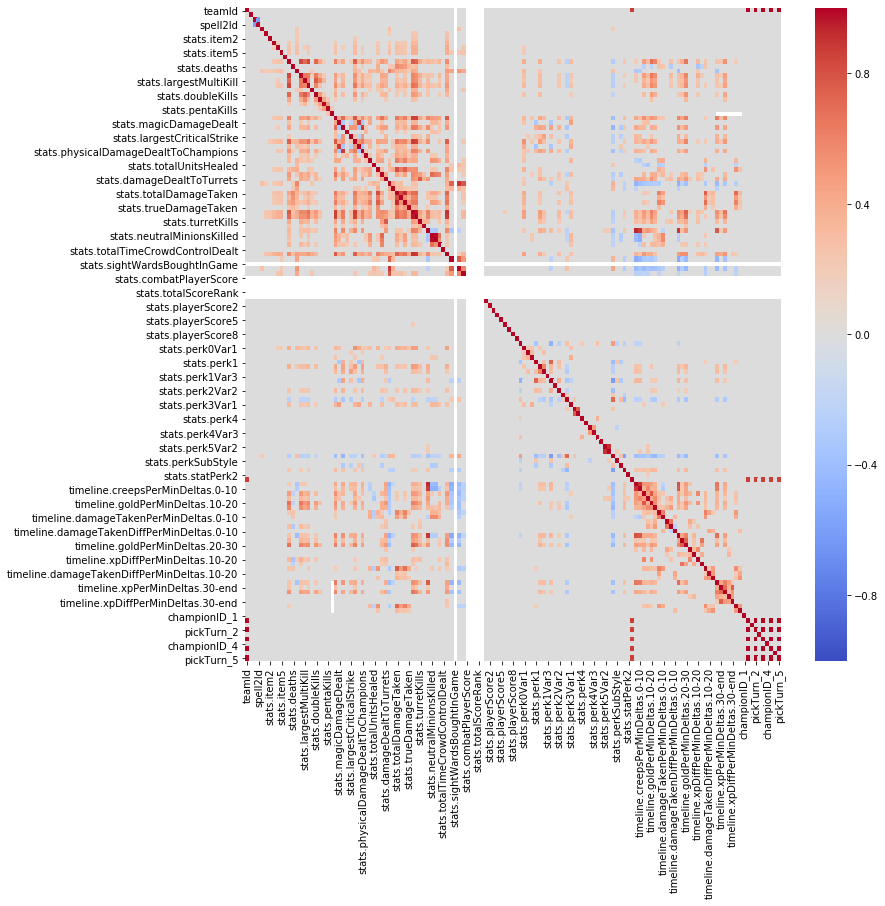

In [46]:
#Correlation Matrix of variables
subjective_corr = descriptors_removed.corr()
subjective_corr[np.abs(subjective_corr)<.2] = 0
plt.figure(figsize=(12,12))
sns.heatmap(subjective_corr,
            vmin=-1,
            vmax=1,
            cmap='coolwarm');

In [47]:
#The value of 0.1 that was applied actually resulted in many outliers as such they need to be removed. 
#It might be best to drop them all together, or we must go through each of the columns independenentally to 
#decide which replacement values would me best. For example we might consider mean or median replacement. 
#instead of dropping all those rows all together.
"""sample_dropped_flattened_merged_df = flattened_merged_df
sample_dropped_flattened_merged_df.dropna(axis=1, inplace=True)
sample_dropped_flattened_merged_df.shape"""

#If we drop everything we endup with an empty dataframe. We have to go back in and 
#individually identify the columns we want to adjust.
# This is the output the script above -------------- (145740, 0)


'sample_dropped_flattened_merged_df = flattened_merged_df\nsample_dropped_flattened_merged_df.dropna(axis=1, inplace=True)\nsample_dropped_flattened_merged_df.shape'

In [48]:
ranked_dataframe.replace({False: 0, True: 1}, inplace=True)
### ALL GAMES ARE NOW CLASSIC MODE AND ARE MATCHED GAMES.... NO INSIGHT WILL DRAWN FROM THESE ATTRIBUTES MUST BE REMOVED
ranked_dataframe.drop(['gameMode','gameType'], axis=1,inplace = True)

teamId


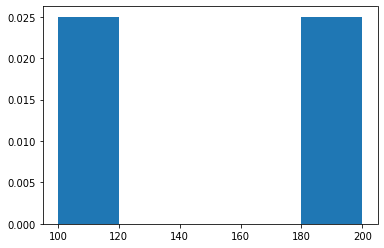

championId


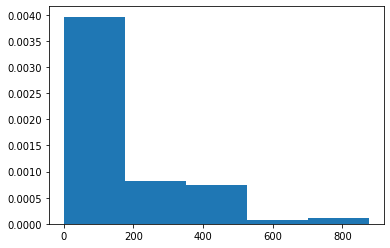

spell1Id


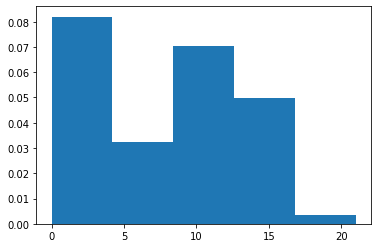

spell2Id


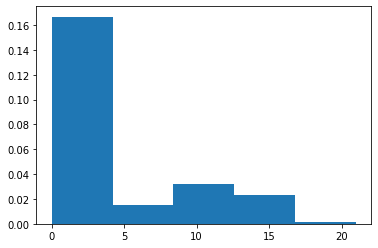

stats.win


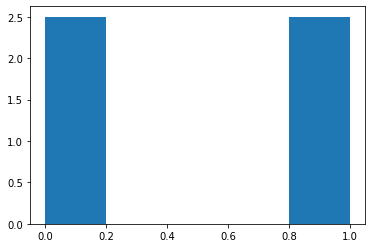

stats.item0


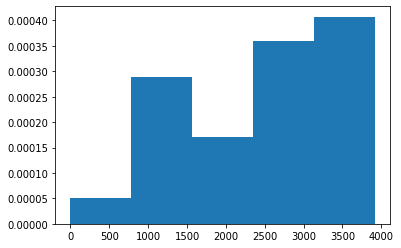

stats.item1


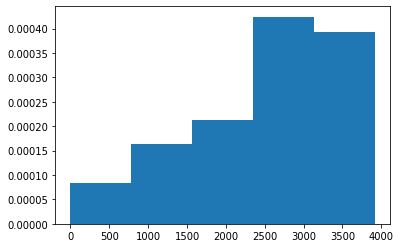

stats.item2


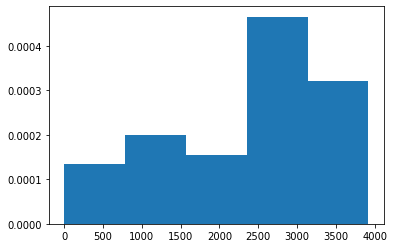

stats.item3


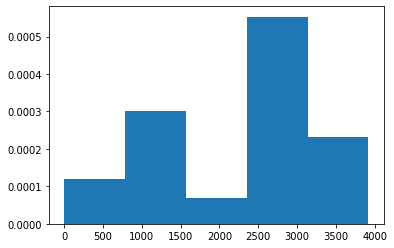

stats.item4


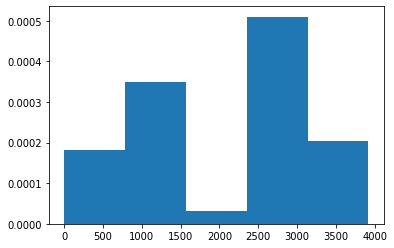

stats.item5


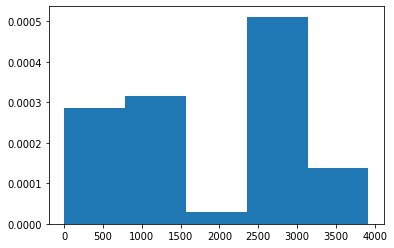

stats.item6


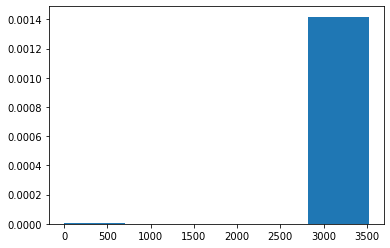

stats.kills


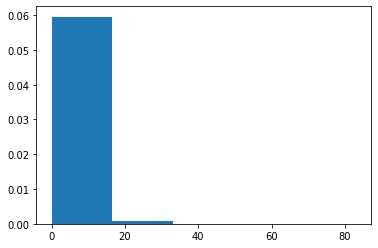

stats.deaths


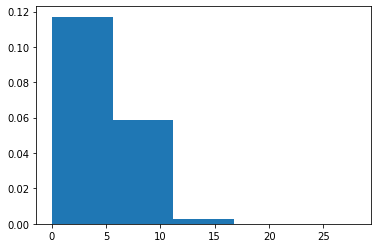

stats.assists


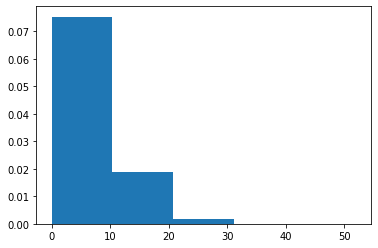

stats.largestKillingSpree


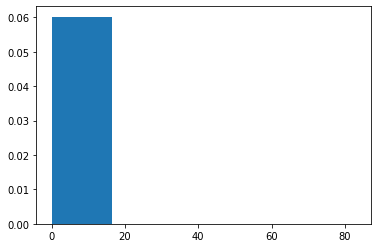

stats.largestMultiKill


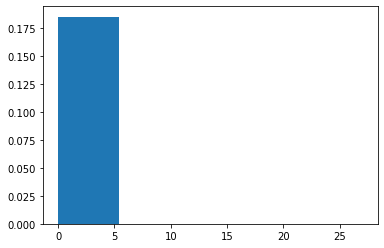

stats.killingSprees


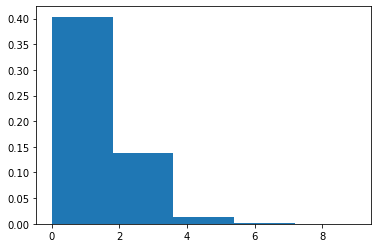

stats.longestTimeSpentLiving


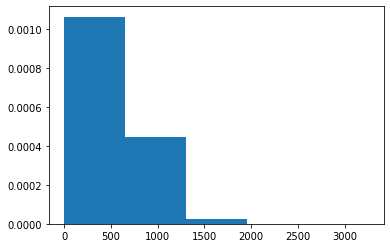

stats.doubleKills


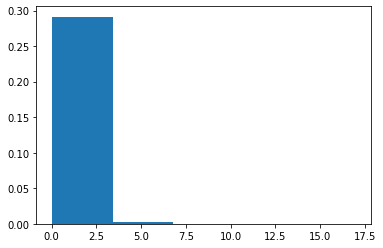

stats.tripleKills


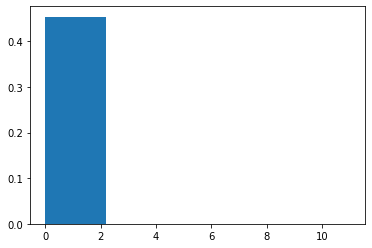

stats.quadraKills


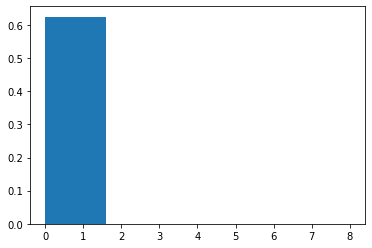

stats.pentaKills


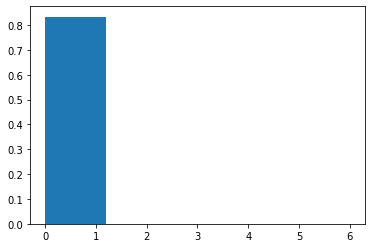

stats.unrealKills


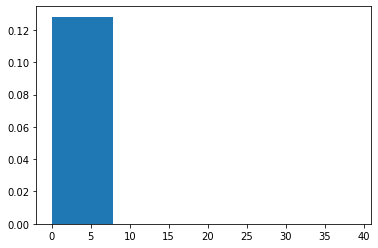

stats.totalDamageDealt


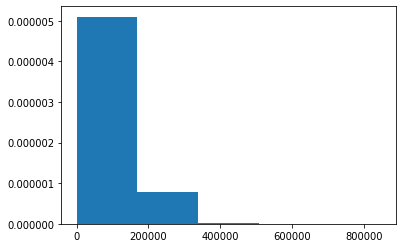

stats.magicDamageDealt


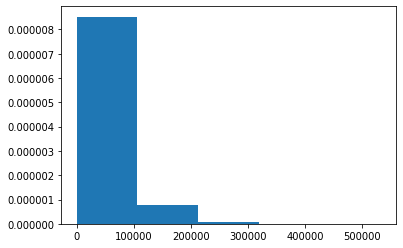

stats.physicalDamageDealt


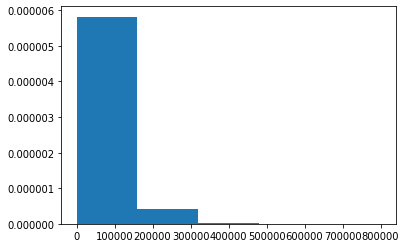

stats.trueDamageDealt


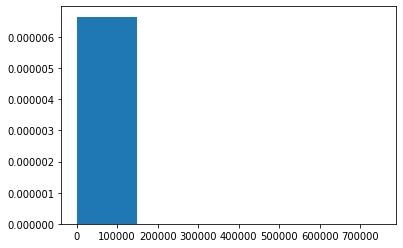

stats.largestCriticalStrike


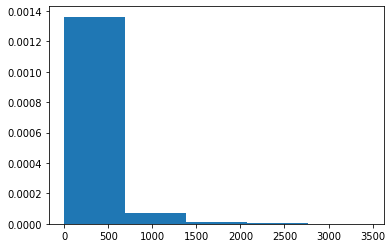

stats.totalDamageDealtToChampions


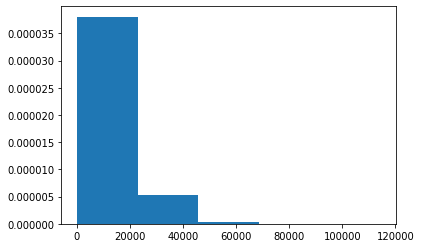

stats.magicDamageDealtToChampions


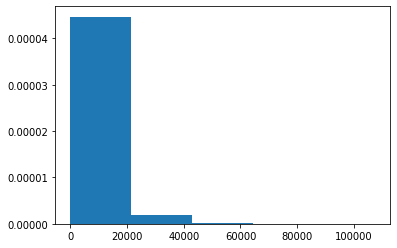

stats.physicalDamageDealtToChampions


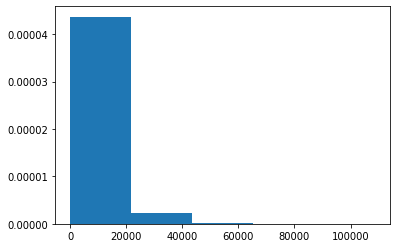

stats.trueDamageDealtToChampions


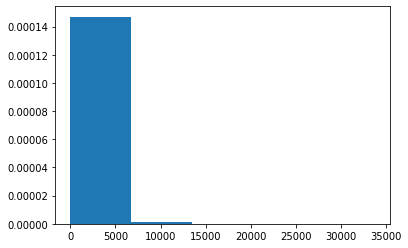

stats.totalHeal


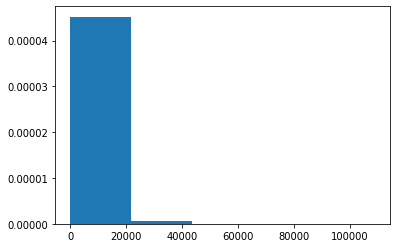

stats.totalUnitsHealed


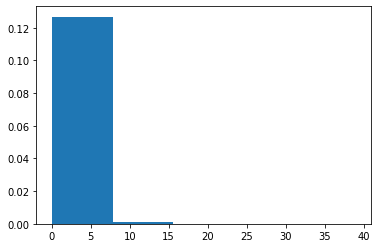

stats.damageSelfMitigated


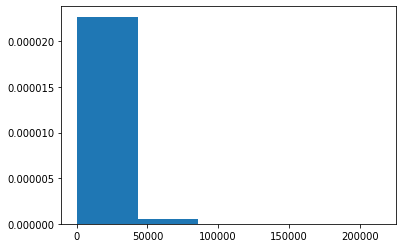

stats.damageDealtToObjectives


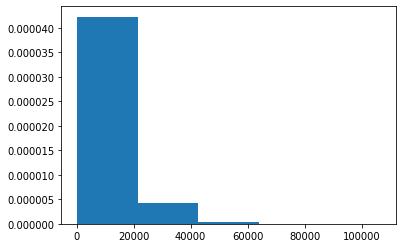

stats.damageDealtToTurrets


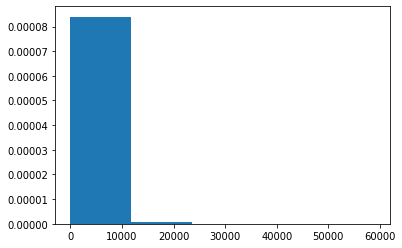

stats.visionScore


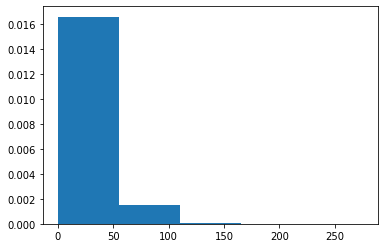

stats.timeCCingOthers


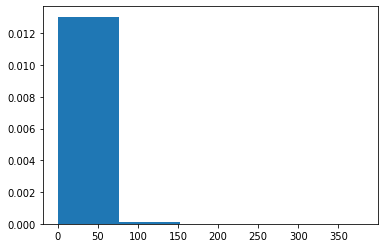

stats.totalDamageTaken


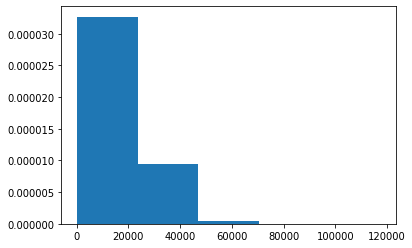

stats.magicalDamageTaken


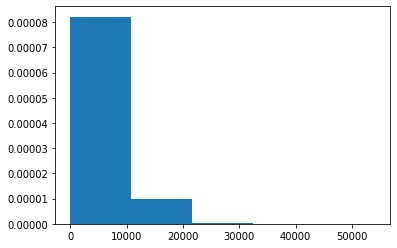

stats.physicalDamageTaken


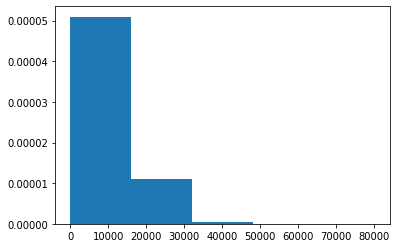

stats.trueDamageTaken


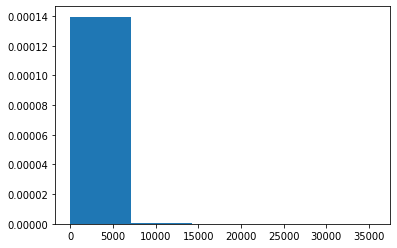

stats.goldEarned


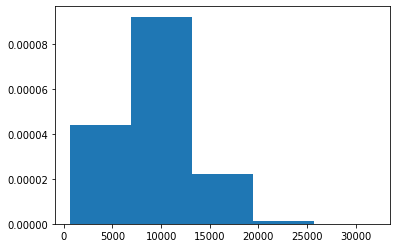

stats.goldSpent


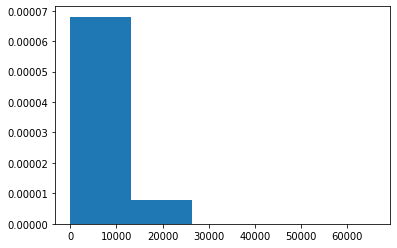

stats.turretKills


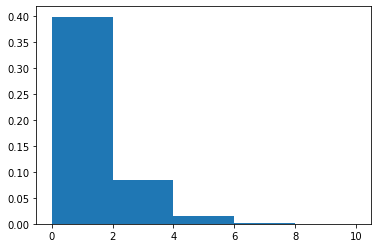

stats.inhibitorKills


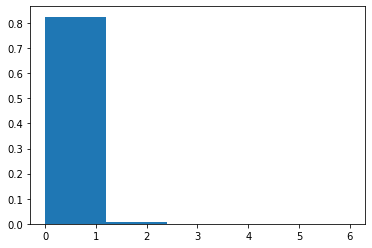

stats.totalMinionsKilled


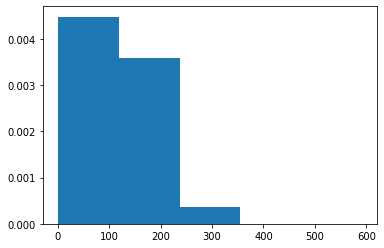

stats.neutralMinionsKilled


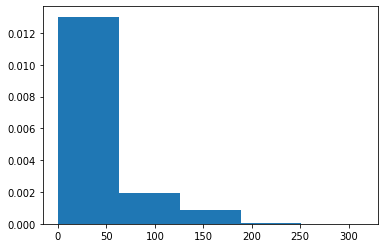

stats.neutralMinionsKilledTeamJungle


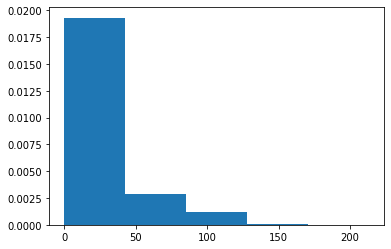

stats.neutralMinionsKilledEnemyJungle


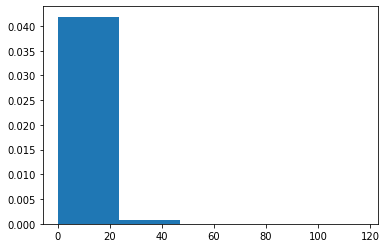

stats.totalTimeCrowdControlDealt


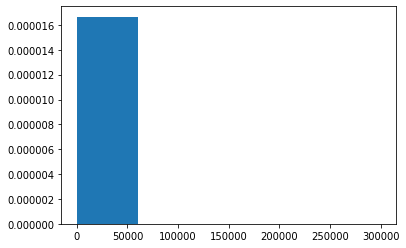

stats.champLevel


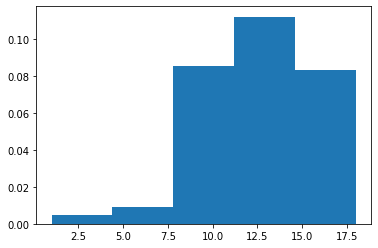

stats.visionWardsBoughtInGame


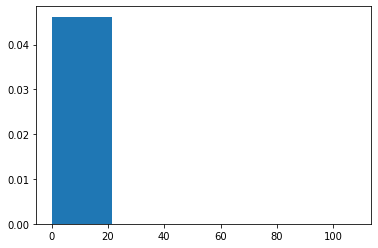

stats.sightWardsBoughtInGame


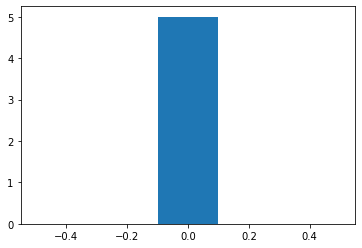

stats.wardsPlaced


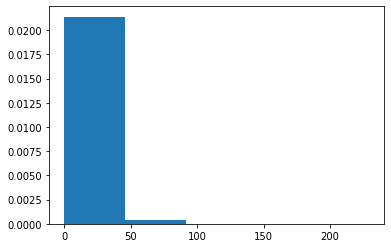

stats.wardsKilled


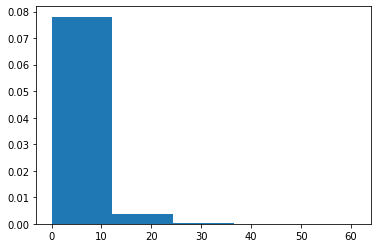

stats.firstBloodKill


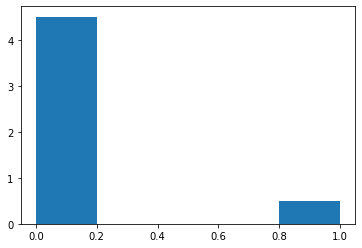

stats.firstBloodAssist


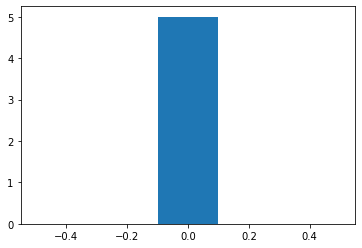

stats.firstTowerKill


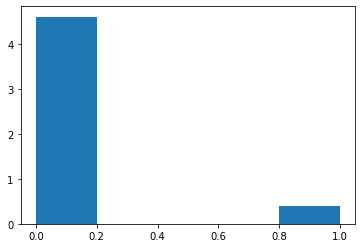

stats.firstTowerAssist


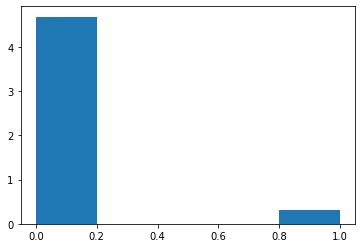

stats.firstInhibitorKill


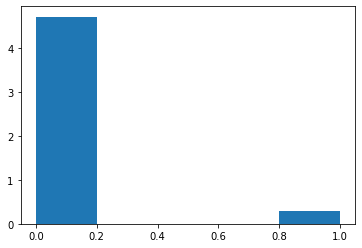

stats.firstInhibitorAssist


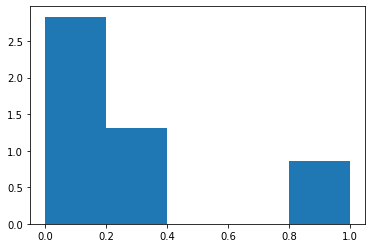

stats.combatPlayerScore


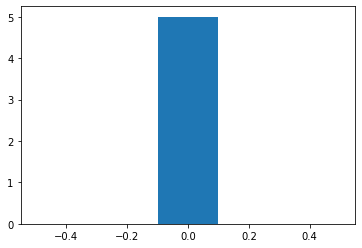

stats.objectivePlayerScore


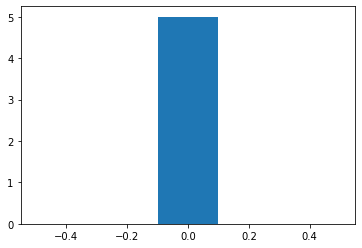

stats.totalPlayerScore


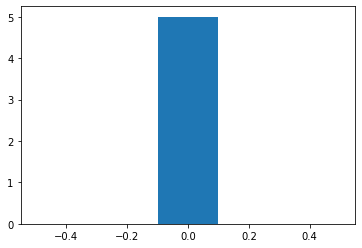

stats.totalScoreRank


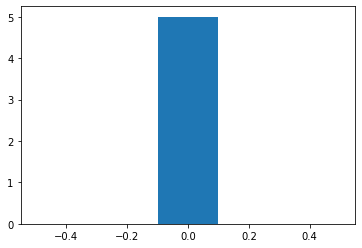

stats.playerScore0


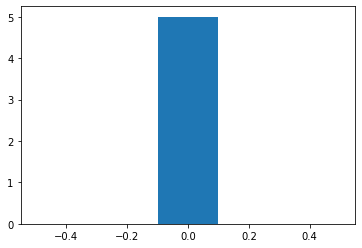

stats.playerScore1


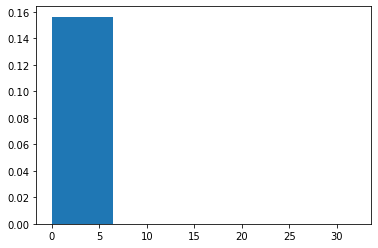

stats.playerScore2


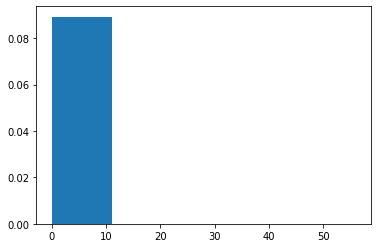

stats.playerScore3


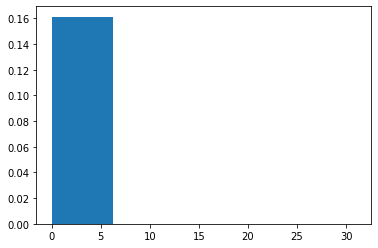

stats.playerScore4


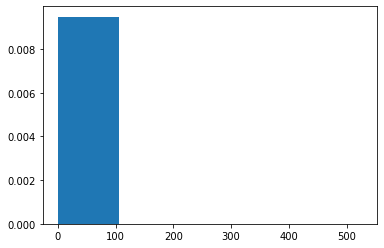

stats.playerScore5


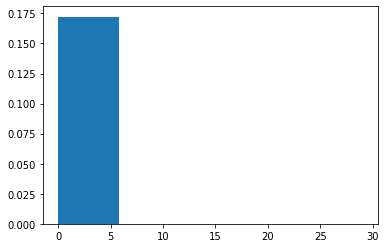

stats.playerScore6


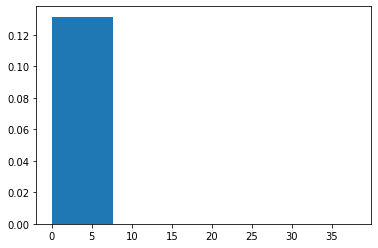

stats.playerScore7


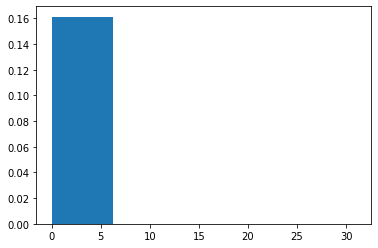

stats.playerScore8


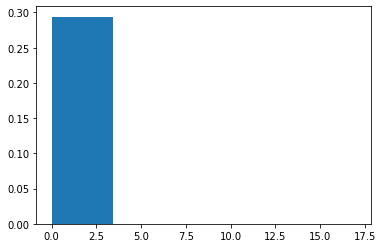

stats.playerScore9


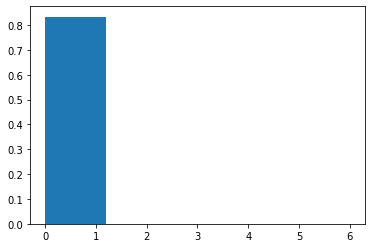

stats.perk0


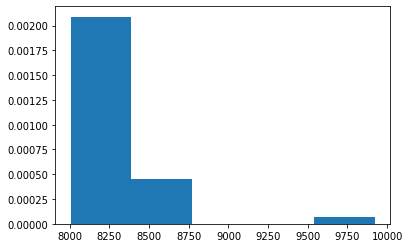

stats.perk0Var1


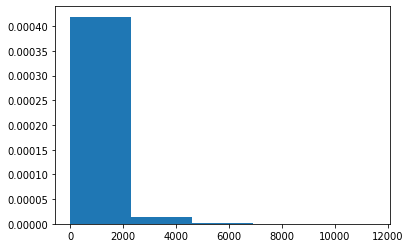

stats.perk0Var2


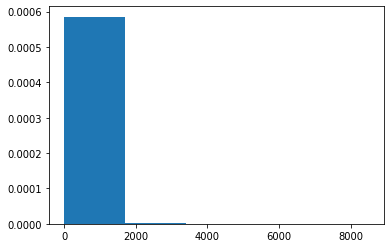

stats.perk0Var3


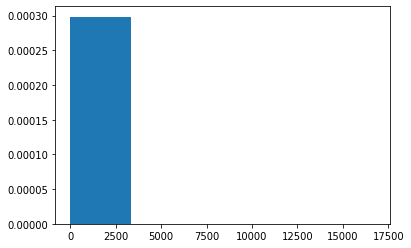

stats.perk1


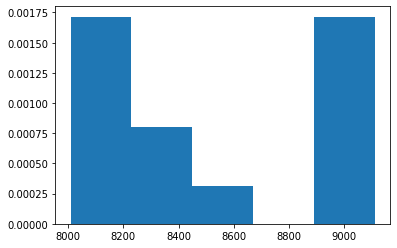

stats.perk1Var1


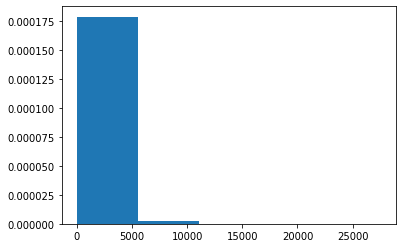

stats.perk1Var2


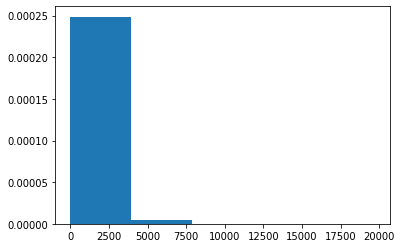

stats.perk1Var3


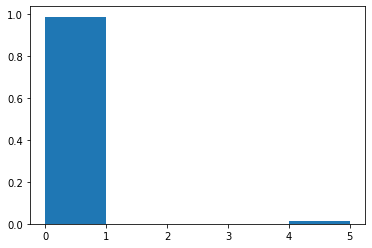

stats.perk2


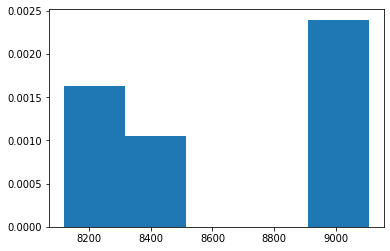

stats.perk2Var1


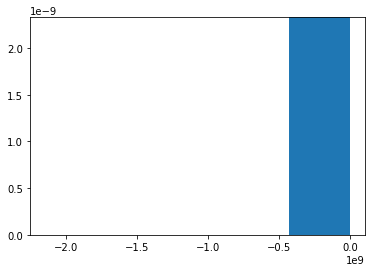

stats.perk2Var2


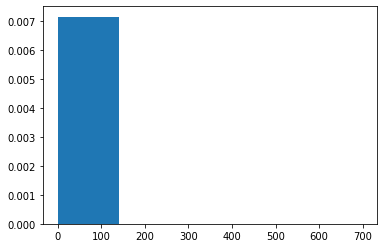

stats.perk2Var3


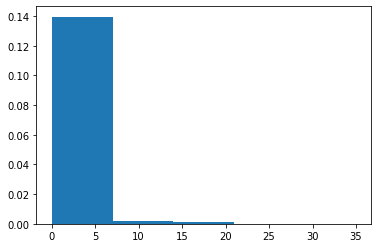

stats.perk3


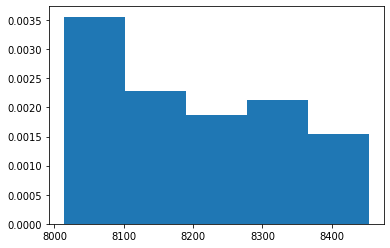

stats.perk3Var1


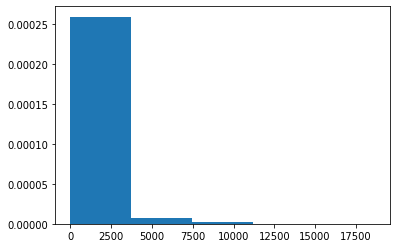

stats.perk3Var2


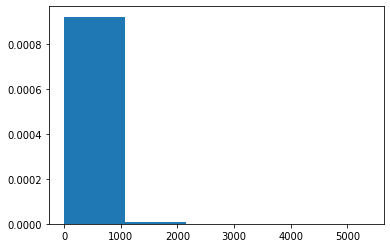

stats.perk3Var3


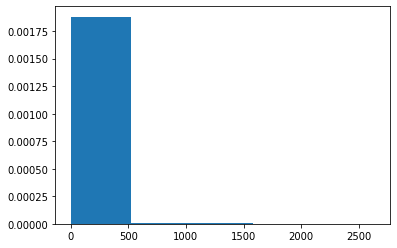

stats.perk4


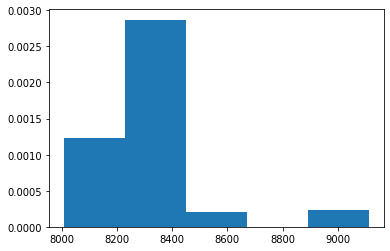

stats.perk4Var1


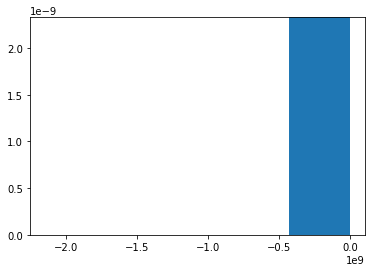

stats.perk4Var2


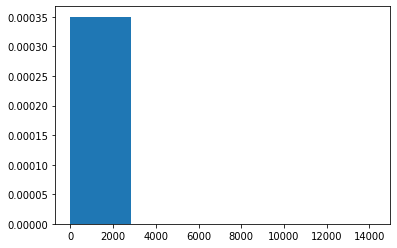

stats.perk4Var3


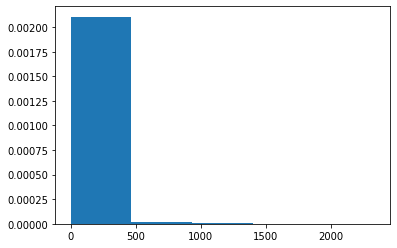

stats.perk5


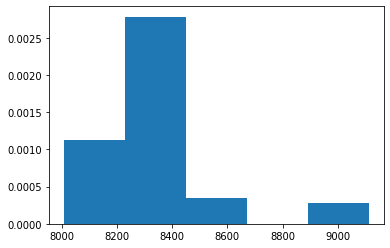

stats.perk5Var1


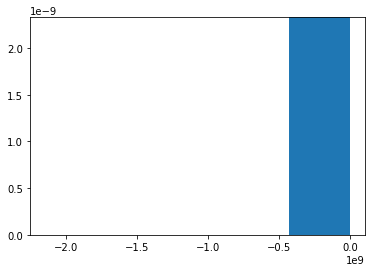

stats.perk5Var2


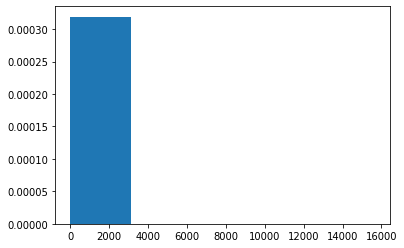

stats.perk5Var3


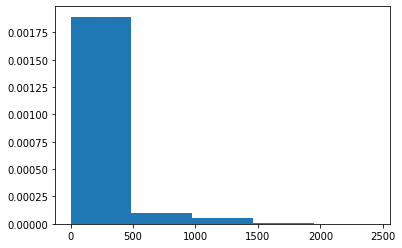

stats.perkPrimaryStyle


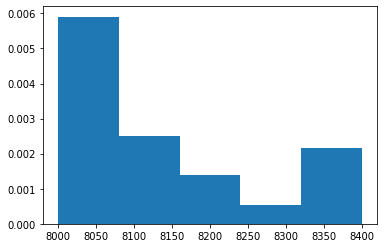

stats.perkSubStyle


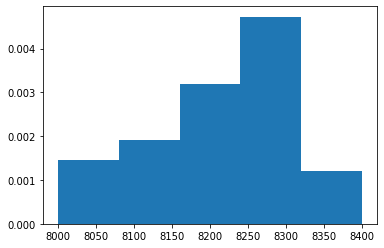

stats.statPerk0


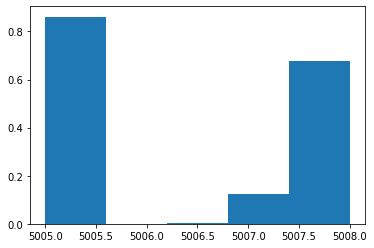

stats.statPerk1


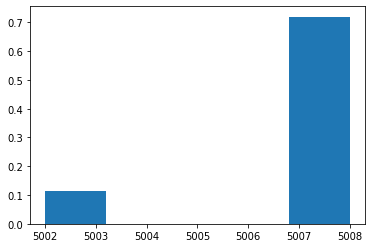

stats.statPerk2


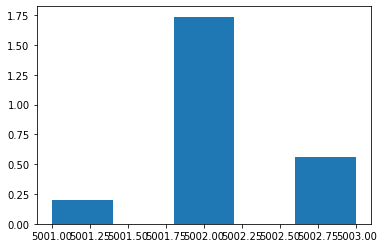

timeline.participantId


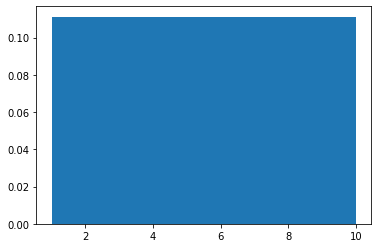

timeline.creepsPerMinDeltas.10-20


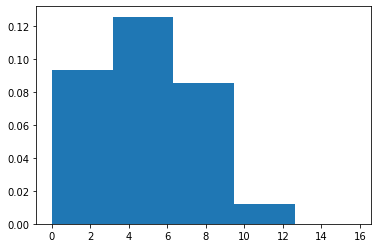

timeline.creepsPerMinDeltas.0-10


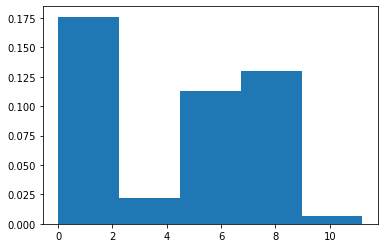

timeline.xpPerMinDeltas.10-20


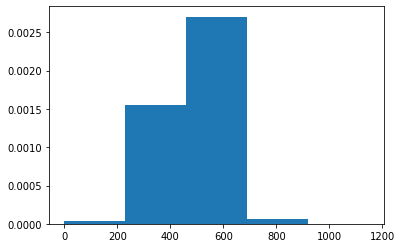

timeline.xpPerMinDeltas.0-10


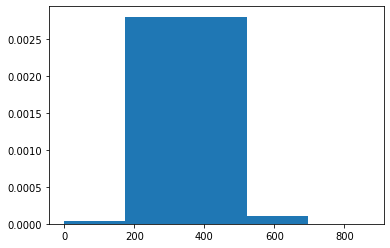

timeline.goldPerMinDeltas.10-20


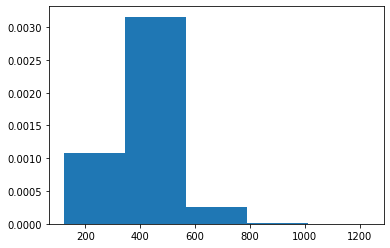

timeline.goldPerMinDeltas.0-10


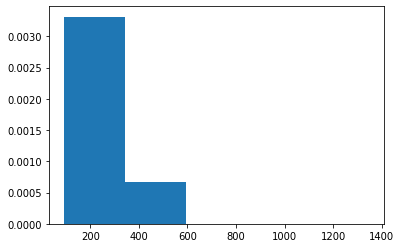

timeline.damageTakenPerMinDeltas.10-20


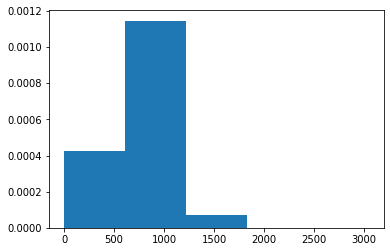

timeline.damageTakenPerMinDeltas.0-10


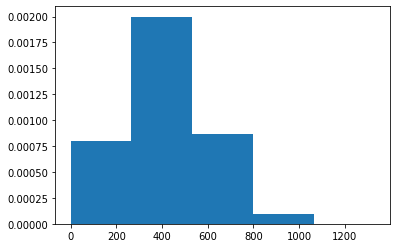

timeline.csDiffPerMinDeltas.0-10


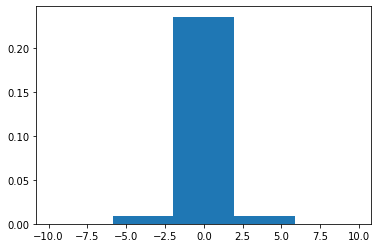

timeline.xpDiffPerMinDeltas.0-10


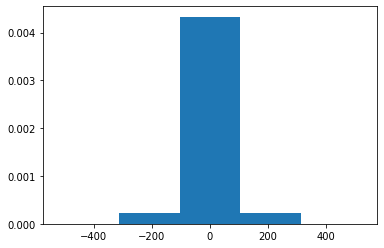

timeline.damageTakenDiffPerMinDeltas.0-10


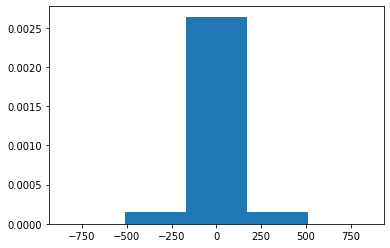

timeline.creepsPerMinDeltas.20-30


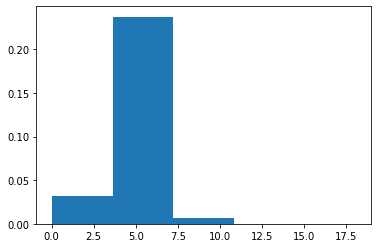

timeline.xpPerMinDeltas.20-30


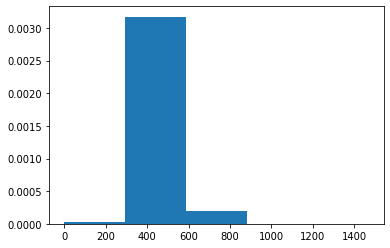

timeline.goldPerMinDeltas.20-30


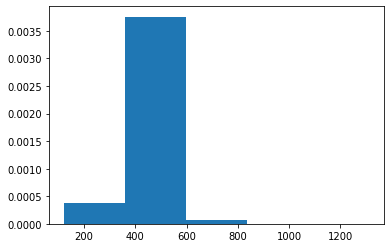

timeline.csDiffPerMinDeltas.10-20


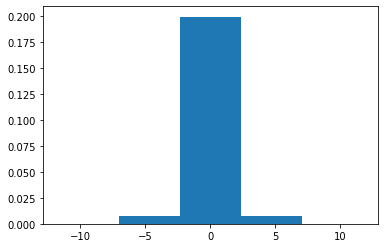

timeline.csDiffPerMinDeltas.20-30


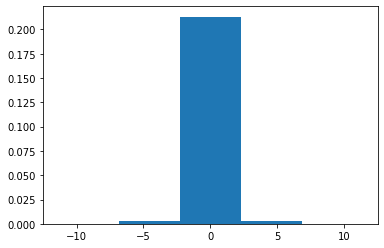

timeline.xpDiffPerMinDeltas.10-20


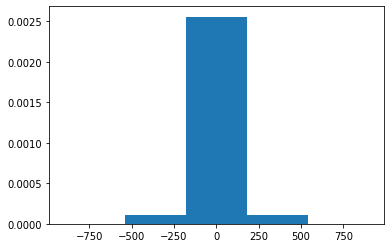

timeline.xpDiffPerMinDeltas.20-30


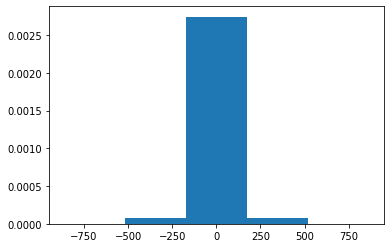

timeline.damageTakenPerMinDeltas.20-30


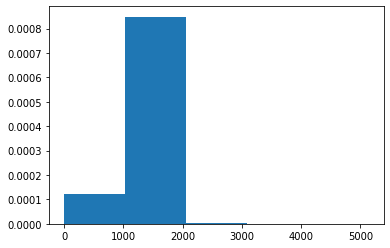

timeline.damageTakenDiffPerMinDeltas.10-20


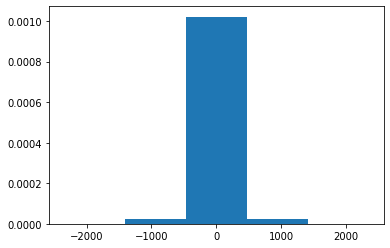

timeline.damageTakenDiffPerMinDeltas.20-30


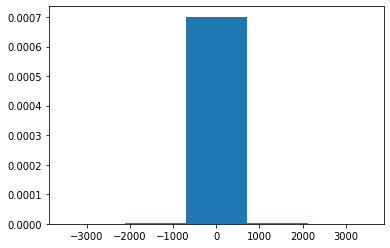

timeline.creepsPerMinDeltas.30-end


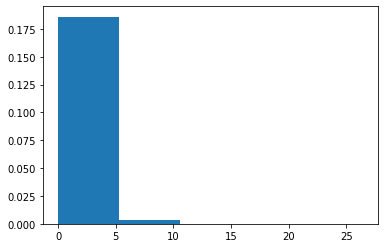

timeline.xpPerMinDeltas.30-end


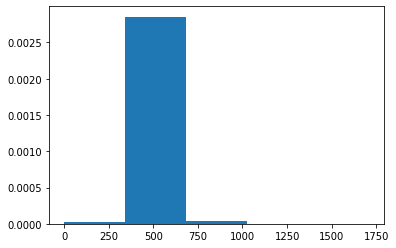

timeline.goldPerMinDeltas.30-end


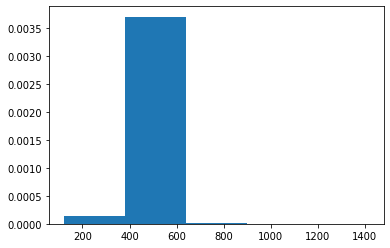

timeline.csDiffPerMinDeltas.30-end


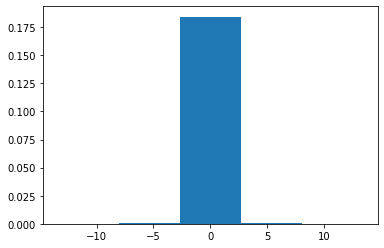

timeline.xpDiffPerMinDeltas.30-end


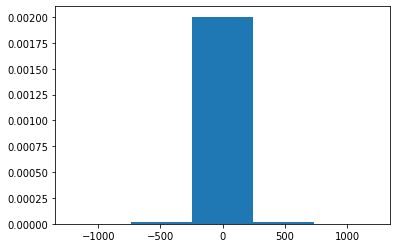

timeline.damageTakenPerMinDeltas.30-end


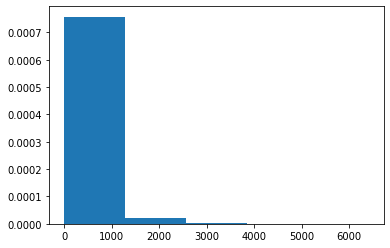

timeline.damageTakenDiffPerMinDeltas.30-end


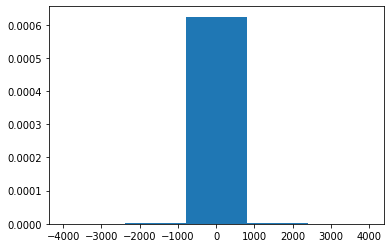

championID_1


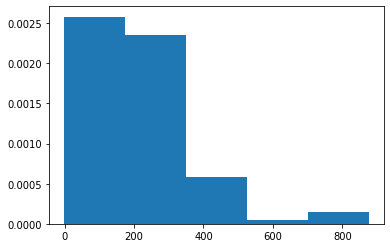

pickTurn_1


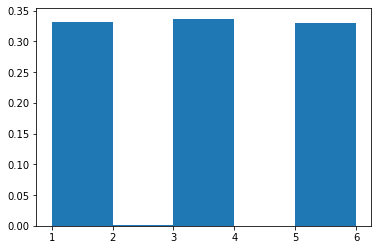

championID_2


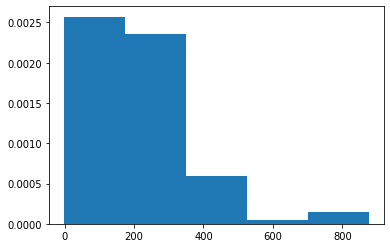

pickTurn_2


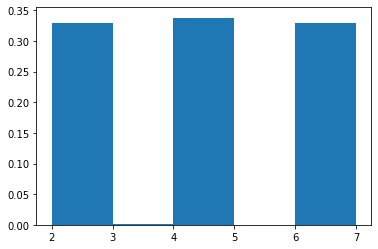

championID_3


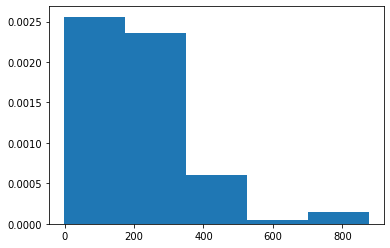

pickTurn_3


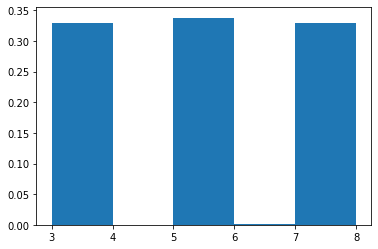

championID_4


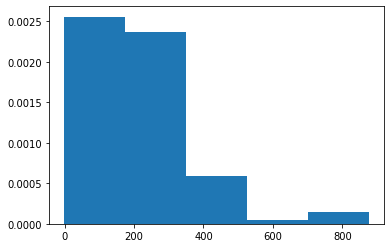

pickTurn_4


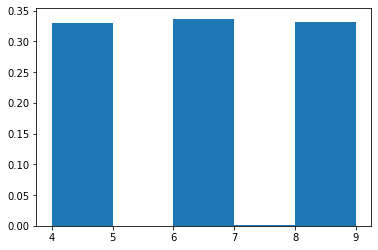

championID_5


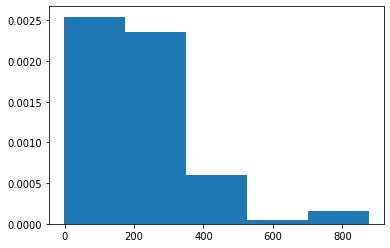

pickTurn_5


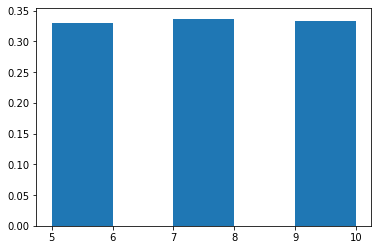

In [49]:
"""The Following Histograms exclude any binary and or true or false variables as well as any str variables"""
for i in descriptors_removed.columns:
    n_bins = 5
    count = 0 
    if(count < 20):
        try:
            sample_game_dur = ranked_dataframe.loc[:,i]
            count+=1
            plt.hist(sample_game_dur, n_bins, density = True, histtype ='bar')
            print(i)
            plt.show()
        except:
            continue

### Normalizing Data and its importance to the Logistic Regression

In [50]:
"""What is the purpose of a logistic regression you might ask?"""
"""Logistic regression estimates the probability of an event occurring,the outcome is a probability, 
the dependent variable is bounded between 0 and 1. 
In logistic regression, a logit transformation is applied on the odds—that 
is, the probability of success divided by the probability of failure. 
This is also commonly known as the log odds, or the natural logarithm of odds."""

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

scaled_features = ranked_dataframe.copy()
col_names = columns_non_descriptors

features = scaled_features[col_names]
scaler = StandardScaler().fit(features.values)

features = scaler.transform(features.values)

scaled_features[col_names] = features

In [51]:
#must Hot Encode the following columns
#Drop mapId Column all are KR no additional information will be gained
#Drop platformId needs to be dropped
#Drop player.currentPlatformId
#Drop player.matchHistoryUri
#Drop gameId (Have to keep to maintain datastructure, is not a significant attribute) , gameCreation
#player.accountId, player.summonerName , player.summonerId, player.currentPlatformId, 
#player.currentAccountId, player.matchHistoryUri

scaled_features.drop(['gameCreation','player.matchHistoryUri','player.currentPlatformId','mapId','player.accountId',
        'player.summonerName' , 'player.summonerId', 'player.currentPlatformId', 
        'player.currentAccountId', 'player.matchHistoryUri','timeline.role'], axis=1,inplace = True)

#One Hot encode the following Columns
#(highestAchievedSeasonTier)
#timeline.lane
season_tier = pd.get_dummies(scaled_features, columns = ['highestAchievedSeasonTier','timeline.lane','gameVersion'])

In [52]:
season_tier.head(5)

,gameId,gameDuration,platformId,queueId,seasonId,participantId,player.platformId,player.profileIcon,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5,highestAchievedSeasonTier_BRONZE,highestAchievedSeasonTier_CHALLENGER,highestAchievedSeasonTier_DIAMOND,highestAchievedSeasonTier_GOLD,highestAchievedSeasonTier_MASTER,highestAchievedSeasonTier_PLATINUM,highestAchievedSeasonTier_SILVER,highestAchievedSeasonTier_UNRANKED,timeline.lane_BOTTOM,timeline.lane_JUNGLE,timeline.lane_MIDDLE,timeline.lane_NONE,timeline.lane_TOP,gameVersion_10.1.303.6554,gameVersion_10.1.303.9385,gameVersion_10.2.305.4739,gameVersion_10.3.307.1028,gameVersion_10.3.307.7898,gameVersion_10.4.308.9400,gameVersion_10.5.311.166,gameVersion_10.5.312.392,gameVersion_10.6.313.2784,gameVersion_10.6.313.8894,gameVersion_10.6.314.4405,gameV

In [53]:
#season_tier = pd.get_dummies(scaled_features, columns = ['highestAchievedSeasonTier','timeline.lane'])
season_tier['Victory'] = 0 

"""NO Winner or Loser was found amoung the dataset we intend to use in our training dataset.. 
this fell through the cracks. """ 

season_tier = pd.DataFrame(season_tier).reset_index()
season_tier.drop(['index'], axis = 1, inplace = True) 
season_tier  = season_tier[season_tier['stats.win'] !=  0.000000]


for row in range(int(len(season_tier['stats.win']) - 1)):
    if(season_tier.iloc[row,11] > 1):
        season_tier.iloc[row,-1] = 1
        print(season_tier.iloc[row,-1])


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [54]:
### Additional Steps are needed prior to the application of the logistic regression 
###Step 1: We Fill in missing Data (Check) 
### Step 2: One Hot encode or remap categorical/labeled attributes
### Step 3: Normalize Dataset

""" You might be asking why is Normalization needed ? """
""" Logistic regression requires normalization in order to avoid the vanishing gradient problem during
the training phase. If you train a linear regression without previous normalization, you can't use the coefficients 
as indicators of feature importance. """

" Logistic regression requires normalization in order to avoid the vanishing gradient problem during\nthe training phase. If you train a linear regression without previous normalization, you can't use the coefficients \nas indicators of feature importance. "

### THE APPLICATION OF FEATURE IMPORTANCE USING RFE -- RECURSIVE FEATURE ELIMINATION

In [55]:
season_tier.drop(['player.platformId','platformId'], axis = 1, inplace = True)
season_tier.head(5)

,gameId,gameDuration,queueId,seasonId,participantId,player.profileIcon,teamId,championId,spell1Id,spell2Id,stats.participantId,stats.win,stats.item0,stats.item1,stats.item2,stats.item3,stats.item4,stats.item5,stats.item6,stats.kills,stats.deaths,stats.assists,stats.largestKillingSpree,stats.largestMultiKill,stats.killingSprees,stats.longestTimeSpentLiving,stats.doubleKills,stats.tripleKills,stats.quadraKills,stats.pentaKills,stats.unrealKills,stats.totalDamageDealt,stats.magicDamageDealt,stats.physicalDamageDealt,stats.trueDamageDealt,stats.largestCriticalStrike,stats.totalDamageDealtToChampions,stats.magicDamageDealtToChampions,stats.physicalDamageDealtToChampions,stats.trueDamageDealtToChampions,stats.totalHeal,stats.totalUnitsHealed,stats.damageSelfMitigated,stats.damageDealtToObjectives,stats.damageDealtToTurrets,stats.visionScore,stats.timeCCingOthers,stats.totalDamageTaken,stats.magicalDamageTaken,stats.physicalDamageTaken,stats.trueDamageTaken,stats.goldEarned,stats.goldSpent,stats.turretKills,stats.inhibitorKills,stats.totalMinionsKilled,stats.neutralMinionsKilled,stats.neutralMinionsKilledTeamJungle,stats.neutralMinionsKilledEnemyJungle,stats.totalTimeCrowdControlDealt,stats.champLevel,stats.visionWardsBoughtInGame,stats.sightWardsBoughtInGame,stats.wardsPlaced,stats.wardsKilled,stats.firstBloodKill,stats.firstBloodAssist,stats.firstTowerKill,stats.firstTowerAssist,stats.firstInhibitorKill,stats.firstInhibitorAssist,stats.combatPlayerScore,stats.objectivePlayerScore,stats.totalPlayerScore,stats.totalScoreRank,stats.playerScore0,stats.playerScore1,stats.playerScore2,stats.playerScore3,stats.playerScore4,stats.playerScore5,stats.playerScore6,stats.playerScore7,stats.playerScore8,stats.playerScore9,stats.perk0,stats.perk0Var1,stats.perk0Var2,stats.perk0Var3,stats.perk1,stats.perk1Var1,stats.perk1Var2,stats.perk1Var3,stats.perk2,stats.perk2Var1,stats.perk2Var2,stats.perk2Var3,stats.perk3,stats.perk3Var1,stats.perk3Var2,stats.perk3Var3,stats.perk4,stats.perk4Var1,stats.perk4Var2,stats.perk4Var3,stats.perk5,stats.perk5Var1,stats.perk5Var2,stats.perk5Var3,stats.perkPrimaryStyle,stats.perkSubStyle,stats.statPerk0,stats.statPerk1,stats.statPerk2,timeline.participantId,timeline.creepsPerMinDeltas.10-20,timeline.creepsPerMinDeltas.0-10,timeline.xpPerMinDeltas.10-20,timeline.xpPerMinDeltas.0-10,timeline.goldPerMinDeltas.10-20,timeline.goldPerMinDeltas.0-10,timeline.damageTakenPerMinDeltas.10-20,timeline.damageTakenPerMinDeltas.0-10,timeline.csDiffPerMinDeltas.0-10,timeline.xpDiffPerMinDeltas.0-10,timeline.damageTakenDiffPerMinDeltas.0-10,timeline.creepsPerMinDeltas.20-30,timeline.xpPerMinDeltas.20-30,timeline.goldPerMinDeltas.20-30,timeline.csDiffPerMinDeltas.10-20,timeline.csDiffPerMinDeltas.20-30,timeline.xpDiffPerMinDeltas.10-20,timeline.xpDiffPerMinDeltas.20-30,timeline.damageTakenPerMinDeltas.20-30,timeline.damageTakenDiffPerMinDeltas.10-20,timeline.damageTakenDiffPerMinDeltas.20-30,timeline.creepsPerMinDeltas.30-end,timeline.xpPerMinDeltas.30-end,timeline.goldPerMinDeltas.30-end,timeline.csDiffPerMinDeltas.30-end,timeline.xpDiffPerMinDeltas.30-end,timeline.damageTakenPerMinDeltas.30-end,timeline.damageTakenDiffPerMinDeltas.30-end,championID_1,pickTurn_1,championID_2,pickTurn_2,championID_3,pickTurn_3,championID_4,pickTurn_4,championID_5,pickTurn_5,highestAchievedSeasonTier_BRONZE,highestAchievedSeasonTier_CHALLENGER,highestAchievedSeasonTier_DIAMOND,highestAchievedSeasonTier_GOLD,highestAchievedSeasonTier_MASTER,highestAchievedSeasonTier_PLATINUM,highestAchievedSeasonTier_SILVER,highestAchievedSeasonTier_UNRANKED,timeline.lane_BOTTOM,timeline.lane_JUNGLE,timeline.lane_MIDDLE,timeline.lane_NONE,timeline.lane_TOP,gameVersion_10.1.303.6554,gameVersion_10.1.303.9385,gameVersion_10.2.305.4739,gameVersion_10.3.307.1028,gameVersion_10.3.307.7898,gameVersion_10.4.308.9400,gameVersion_10.5.311.166,gameVersion_10.5.312.392,gameVersion_10.6.313.2784,gameVersion_10.6.313.8894,gameVersion_10.6.314.4405,gameVersion_8.10.229.7328,gameVers

In [54]:
season_tier['Victory'].value_counts()

0    948192
1    295642
Name: Victory, dtype: int64

In [59]:
#write dataframe out as serialized file
slol_s_df = season_tier.to_pickle('\\Users\\abdullahadlouni\\Desktop\\LOL_season_tier.pickle')

In [3]:
rlol_s_df = pd.read_pickle('LOL_season_tier.pickle')

In [4]:
rlol_s_df.head(5)

,gameId,gameDuration,queueId,seasonId,participantId,player.profileIcon,teamId,championId,spell1Id,spell2Id,...,gameVersion_9.4.264.1140,gameVersion_9.4.264.7309,gameVersion_9.5.265.6479,gameVersion_9.6.267.4221,gameVersion_9.6.268.2663,gameVersion_9.7.269.2391,gameVersion_9.7.270.125,gameVersion_9.8.270.9450,gameVersion_9.9.272.4950,Victory
0,3189535611,1220.0,420.0,11.0,4.0,1625.0,-1.000058,1.806120,-1.105834,2.013058,...,0,0,0,0,0,0,0,0,0,1
1,3189535611,1220.0,420.0,11.0,3.0,3172.0,-1.000058,1.384883,-1.105834,1.235880,...,0,0,0,0,0,0,0,0,0,1
2,3189535611,1220.0,420.0,11.0,1.0,3369.0,-1.000058,-0.865409,-0.426901,-0.577534,...,0,0,0,0,0,0,0,0,0,0
3,3189535611,1220.0,420.0,11.0,9.0,7.0,1.000058,-0.499598,-1.105834,0.199644,...,0,0,0,0,0,0,0,0,0,0
4,3189535611,1220.0,420.0,11.0,8.0,907.0,1.000058,1.335000,-1.105834,2.013058,...,0,0,0,0,0,0,0,0,0,1


# Work on Feature Reduction -- Reapply Logistic Regression 
# Followed by Test and Validation Process 

### Train_Test_Split -- Using Sklearn

In [4]:
from sklearn.model_selection import train_test_split

#Data is too large 

X = rlol_s_df.drop(columns = ['Victory']).copy()
y = rlol_s_df['Victory']

# In the first step we will split the data in training and remaining dataset
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8,random_state=0)

#split down further due to data size 
X_valid, X_test, y_valid, y_test = train_test_split(X_train,y_train, test_size=0.5,random_state=0)

In [5]:
#Logistic Regression Model 
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train,y_train)

y_pred = logreg.predict(X_rem)

In [6]:
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

print(str.format('Accuracy: {:.2f}%', logreg.score(X_rem, y_rem)*100))
#measures the proportion of positively predicted labels that are actually correct. 
#Precision is also known as the positive predictive value.
print('Precision: %.3f' % precision_score(y_rem, y_pred))
print('Recall: %.3f' % recall_score(y_rem, y_pred))
print('F1 Score: %.3f' % f1_score(y_rem, y_pred))

Accuracy: 76.27%
Precision: 0.000
Recall: 0.000
F1 Score: 0.000


/Users/abdullahadlouni/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Feature Selection and ROC curve Checks

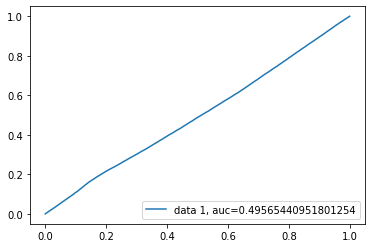

In [7]:
ypredprob = logreg.predict_proba(X_test)[:,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  ypredprob)
auc = metrics.roc_auc_score(y_test, ypredprob)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

    CHECK FOR UNIMPORTANT FEATURES AND MULTICOLLINEARITY

In [141]:
from xgboost import XGBClassifier

#using Xgboost
model = XGBClassifier()
# fit the model
model.fit(X_valid, y_valid)


/Users/abdullahadlouni/anaconda3/lib/python3.7/site-packages/xgboost/data.py:322: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  transformed[data.columns[i]] = data[data.columns[i]]


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

Feature: 0, Score: 0.00000
Feature: 1, Score: 0.00000
Feature: 2, Score: 0.00000
Feature: 3, Score: 0.00000
Feature: 4, Score: 0.00000
Feature: 5, Score: 0.00000
Feature: 6, Score: 0.00000
Feature: 7, Score: 0.00000
Feature: 8, Score: 0.00002
Feature: 9, Score: 0.99998
Feature: 10, Score: 0.00000
Feature: 11, Score: 0.00000
Feature: 12, Score: 0.00000
Feature: 13, Score: 0.00000
Feature: 14, Score: 0.00000
Feature: 15, Score: 0.00000
Feature: 16, Score: 0.00000
Feature: 17, Score: 0.00000
Feature: 18, Score: 0.00000
Feature: 19, Score: 0.00000
Feature: 20, Score: 0.00000
Feature: 21, Score: 0.00000
Feature: 22, Score: 0.00000
Feature: 23, Score: 0.00000
Feature: 24, Score: 0.00000
Feature: 25, Score: 0.00000
Feature: 26, Score: 0.00000
Feature: 27, Score: 0.00000
Feature: 28, Score: 0.00000
Feature: 29, Score: 0.00000
Feature: 30, Score: 0.00000
Feature: 31, Score: 0.00000
Feature: 32, Score: 0.00000
Feature: 33, Score: 0.00000
Feature: 34, Score: 0.00000
Feature: 35, Score: 0.00000
Fe

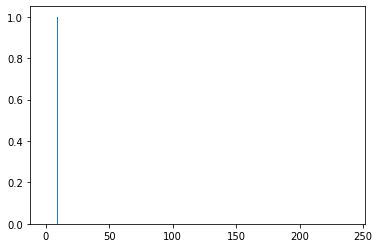

In [142]:
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [ ]:
#Feature Number 8 or Feature Number 9 are deemed to be the most important

# Logistic Regression Optimization

Initial goal was to run gridsearch cv to help optimatize the optimal model perameters. However due to the size of the dataset and the level of dimensionality this data has. It was best to manually iterate, and provide the best summary this way. In short due to minimal memory availability the calculation of gridsearch cv could not be completed. Inital attempt at calcualting took longer than 15 hours without a result.

In [12]:
X = rlol_s_df.iloc[:,8:10]
y = rlol_s_df['Victory']

# In the first step we will split the data in training and remaining dataset
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8,random_state=0)

Due to the dimensionality of the data leveraging either a sag or saga solver would be best. Leveraging Liblinear would not be wise given the size of the dataset. L2 penalty will not be used. 
second attempt will be an lbfgs comparison against the saga results 

In [13]:
#Logistic Regression Model 
from sklearn.linear_model import LogisticRegression

logreg_2 = LogisticRegression()
logreg_2.fit(X_train,y_train)

y_pred_2 = logreg_2.predict(X_rem)

In [26]:
#measures the proportion of positively predicted labels that are actually correct. 
#Precision is also known as the positive predictive value.
print(str.format('Accuracy: {:.2f}%', logreg_2.score(X_rem, y_rem)*100))
print('Precision: %.1f' % precision_score(y_rem, y_pred_2))
print('Recall: %.1f' % recall_score(y_rem, y_pred_2))
print('F1 Score: %.1f' % f1_score(y_rem, y_pred_2))

Accuracy: 100.00%
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


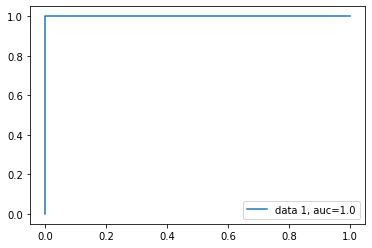

In [25]:
ypredprob_2 = logreg_2.predict_proba(X_rem)[:,1]
fpr, tpr, _ = metrics.roc_curve(y_rem,  ypredprob_2)
auc = metrics.roc_auc_score(y_rem, ypredprob_2)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

# Alternative Models (Decision Tree Classficiation)
Couldn't Use SVM due to computational costs

In [27]:
from sklearn.model_selection import train_test_split

#Data is too large 

X = rlol_s_df.drop(columns = ['Victory']).copy()
y = rlol_s_df['Victory']

# In the first step we will split the data in training and remaining dataset
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8,random_state=0)


In [80]:
from sklearn import decomposition
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn.metrics import  confusion_matrix
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeRegressor

In [28]:
from sklearn.tree import DecisionTreeClassifier

d_tree_model = DecisionTreeClassifier(criterion="gini", random_state= 0 ,max_depth= 4 , min_samples_leaf=5)   
d_tree_model.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, min_samples_leaf=5, random_state=0)

In [73]:
d_tree_pred = d_tree_model.predict(X_rem)

In [74]:
feature_names = list(X.columns)

In [75]:
from sklearn.tree import export_text
treee = export_text(d_tree_model, feature_names=feature_names)
print(treee)

|--- spell2Id <= 0.72
|   |--- class: 0
|--- spell2Id >  0.72
|   |--- class: 1



In [81]:
print("Accuracy Results: ", accuracy_score(y_rem,d_tree_pred))
print("Confusion Matrix: ", confusion_matrix(y_rem, d_tree_pred))
print("Report Output: ", classification_report(y_rem, d_tree_pred))

Accuracy Results:  1.0
Confusion Matrix:  [[189739      0]
 [     0  59028]]
Report Output:                precision    recall  f1-score   support

           0       1.00      1.00      1.00    189739
           1       1.00      1.00      1.00     59028

    accuracy                           1.00    248767
   macro avg       1.00      1.00      1.00    248767
weighted avg       1.00      1.00      1.00    248767



In [88]:
# Calculating the mean absolute error 
#Provides the average of the absolute errors between actuals and predicted values
""" What does an MAE of zero even mean ? 
In short when MAE is closer 0, the more accurate the model is. 
But MAE is returned on the same scale as the target variable we are trying predicting 
The interpretation of your the MAE value is specific to the values within the dataset."""

mae_test = mean_absolute_error(y_rem, d_tree_pred).round(2)

print(f"Test MAE: {mae_test}")

Test MAE: 0.0


# Results and Conclusions

    To summarize the following 240 attributes are important to the overall game and how it is played. There also highly correlated variables that have been dropped and removed from our dataset over the process of data exploration and analysis. Moving in to the modeling phase we later used VIF(also known as variance inflation factor.) The purpose is to understand which variables are contributing to multicolinearty and which are not. Those that have high multicolinearity above 5 are considered highly colinear with other features within the dataset, and should be removed. I also leveraged a package from sklearn that helps identify feature importance. The benefit of using (xgboost- also known as gradient boosting) is that after a tree is made,is pretty easy to obtain importance scores for each feature. Why does that matter, well the importance provides a score that indicates how useful a feature was in the construction of the decision trees within the model. The more an attribute is used to make key decisions with decision trees, the higher its relative importance. Each feature is then ranked amoung the other to provide the level of importance for each feature. We are able to calculate the importance by the amount that each attribute split point improves the performance measure, weighted by the number of observations the node is responsible for. The performance measure may be the purity (Gini index).

    Upon the removal of unimportant features i was able to improve the overall precision, and recall score from my inital model. I had attempted to leaverage methods by which to iterativley check for the best model parameters using Gridsearchcv. However due to limited computational power and memory available to me i had to manually iterate to identify a suitable model. I did not retain these iterations as they would take up alot of memory. However i am dubious as to the final results of the logistic regression model as they indicate spell1 and spell2 are the primary indicators of a victory regardless of rank within the game. The precision and recall, F1 scores all indicated all your wins in our samples are properly classified as wins. While also meaning that none of our wins in the sample where miscateogorized as losses. Recall also tells us that all wins classfications have been identified as wins correctly. While the F1 score of 1 tells us that the harmonic mean or simply the average of the two is also 1.

    I find this to be rather odd given the extrodinary amount of strategy baked within the game. This is leading me to believe that my choice of model for this project was incorrectly chosen. I believed there might have been alot of error that is presenting itself in my logistic regression especially given the number of attributes, as well as categorical variables(one hot encoded attributes) in the dataset. I do not believe it be overfitting given the fact that the dataset used is rather large given the number of attributes used. The initial dataset presented with roughly 75% accuracy while the final model provided 100% accuracy given that all of the noise within the model had been removed.

    This can also be confirmed by the fact the the test results actually produced better predictors than the training set when initially tested. This was just one method by which overfitting was addressed. In order to remove any doubts as to the results of the logistic regression i performed an applied an alternative classfication model, Decsion tree classfier. The reason for the decsion tree choice is to avoid the issue of overfitting and multicolinearity that might have not been accounted for in the logistic regression. After running the decison tree i found the results mimicked those produced by the logstic regression. 

The most ideal model results are those of the decision tree as they are the easiest to interpret and decipher.
I have placed the results below.


# Model Results Meaning: 
SpellIDs that are less than 0.72 are indicative of certain spells that if selected will most likely be the leading causes of a loss while values that are greater than will be indicative of a victory.Unfortunately no specfic values were provided by the dataset own that would help map the values to a meaningful spell. However as we can see the values lend themselves very well to a logistic regression.

In [89]:
#The print out of the decision tree 
print(treee)

|--- spell2Id <= 0.72
|   |--- class: 0
|--- spell2Id >  0.72
|   |--- class: 1



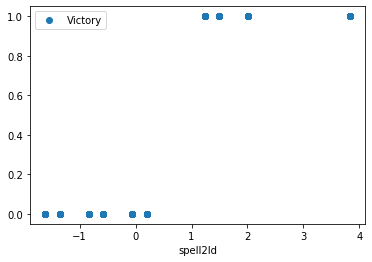

In [92]:
rlol_s_df.plot(x='spell2Id', y='Victory', style='o')

In [90]:
print("Accuracy Results: ", accuracy_score(y_rem,d_tree_pred))
print("Confusion Matrix: ", confusion_matrix(y_rem, d_tree_pred))
print("Report Output: ", classification_report(y_rem, d_tree_pred))

Accuracy Results:  1.0
Confusion Matrix:  [[189739      0]
 [     0  59028]]
Report Output:                precision    recall  f1-score   support

           0       1.00      1.00      1.00    189739
           1       1.00      1.00      1.00     59028

    accuracy                           1.00    248767
   macro avg       1.00      1.00      1.00    248767
weighted avg       1.00      1.00      1.00    248767

